<a href="https://colab.research.google.com/github/goforswap/Covid-19-Predicition/blob/main/COVID_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Importing Necessary Libraries**

In [ ]:
# Importing Necessary Libraries

import os                                                                                       # For Importing the Datasets
import cv2                                                                                      # For converting the image into array
import numpy as np                                                                              # For Array Operations
import matplotlib.pyplot as plt                                                                 # For plotting images and Graphs
import seaborn as sns                                                                           # For plotting visually aesthetic Graphs
import tensorflow as tf                                                                         # For implementing Models
from sklearn.utils import shuffle                                                               # For shuffling the dataset
from sklearn.model_selection import train_test_split                                            # To split dataset into training and testing set
from keras.utils.np_utils import to_categorical                                                 # For categorizing labels to 1-D vector
from tensorflow.keras import layers                                                             # To add layers to the CNN Model
from tensorflow.keras.models import Sequential                                                  # Using Sequential Model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, BatchNormalization       # Using Conv2D, MaxPool2D, Dense, Flatten, Batch Normalization Layers in the Sequential Model
from tensorflow.keras.optimizers import Adam                                                    # Using Adam Optimizer
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping                   # Using Learning Rate Reduction, Model Checkpoint, Early Stopping Callbacks in the Sequential Model
from keras.utils.vis_utils import plot_model                                                    # For Plotting the CNN Model
from sklearn.metrics import confusion_matrix, classification_report                             # For Evaluating the Model

In [ ]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# setup gpu 
# !nvidia-smi
# tf.test.is_gpu_available()
#print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# **Importing Dataset & Pre-Processing**

In [ ]:
# Importing the Dataset for the Google Drive
data = []       # This List Consist of Images in the form of Array
label = []      # This List Consists of the Class of the Image
Files = ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']      # Classes of the Dataset
label_val = 0

for files in Files:
    # Joining the Drive Path in order to Extract the Images
    cpath = os.path.join("/content/drive/MyDrive/COVID-19_Radiography_Dataset", files)
    for img in os.listdir(cpath):
        # Converting The Images in the File Directory to the Image Array
        image_array = cv2.imread(os.path.join(cpath, img), cv2.IMREAD_COLOR)
        # Resizing the image array from 299x299 to 70x70
        image_array = cv2.resize(image_array, (70, 70))
        # Appending the Image Array in the data list
        data.append(image_array)
        # Appending the Label Value in the label list
        label.append(label_val)
    label_val = label_val+1

In [ ]:
# Transforming the Data as well as Label list into the form of array
X = np.asarray(data)
y = np.asarray(label)

In [ ]:
# Shuffling both the Feature and Target set
X, y = shuffle(X, y)

In [ ]:
# Splitting the dataset into Training and Testing Set
# The dataset consists of 21165 images, 
# Here, Training Set consists of 80%
# and Testing Set consists of 20%.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Printing the Shapes of the Training and Testing Set
print('Shape of X_train is {}'.format(X_train.shape))
print('Shape of X_test is {}'.format(X_test.shape))
print('Shape of y_train is {}'.format(y_train.shape))
print('Shape of y_test is {}'.format(y_test.shape))

Shape of X_train is (16932, 70, 70, 3)
Shape of X_test is (4233, 70, 70, 3)
Shape of y_train is (16932,)
Shape of y_test is (4233,)


In [ ]:
# Normalizing the Training and Testing X 
# in order to reduce the illumination effect
# and since CNN converge faster on [0..1]
# Also the pixel value ranges from 0-255 
X_train=X_train/255
X_test=X_test/255

# Labeling the categorical data using
# one-hot encoding among 4 categories
# That is to One-hot Vectors
# Thus, 2 will now be [0,0,1,0]
y_train_cat=to_categorical(y_train,4)
y_test_cat=to_categorical(y_test,4)

# **Visualizing the Data**

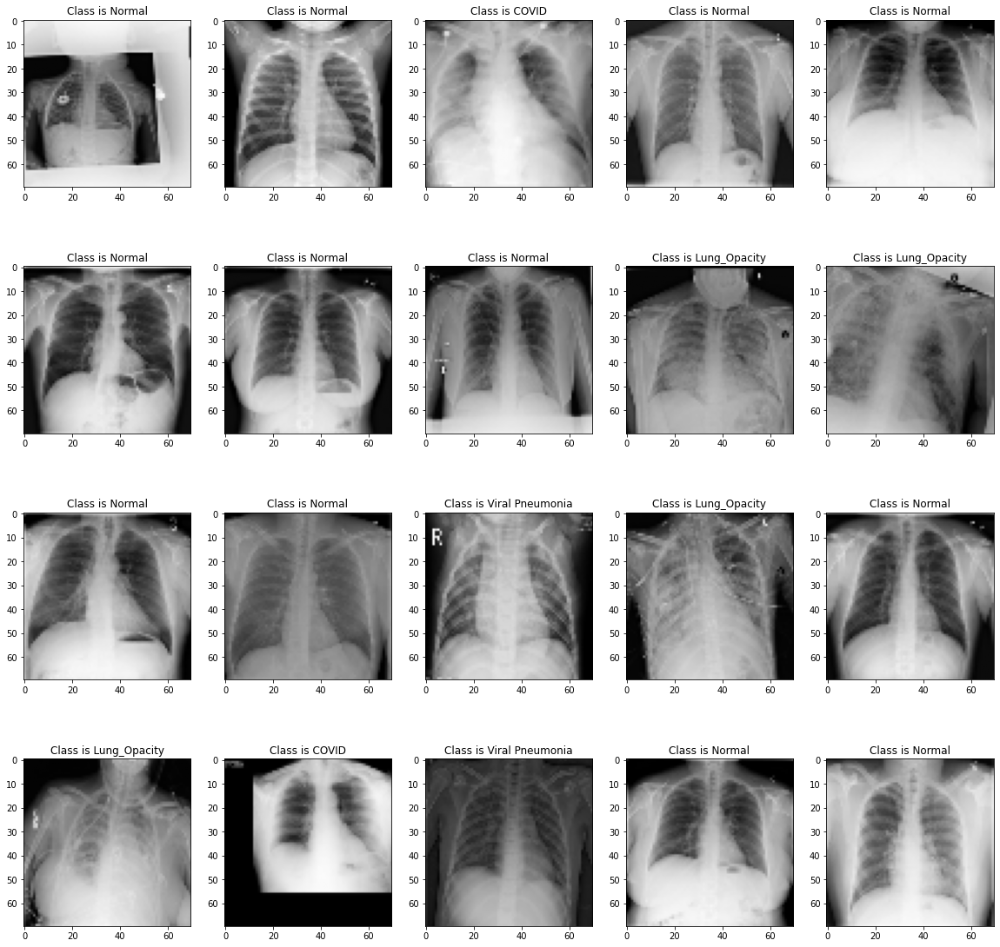

In [ ]:
# Visualizing the Data

# Reshaping in order to Plot it as Image
X_train__ = X_train.reshape(X_train.shape[0], 70, 70, 3)

# Plotting the Images such that only 4 row will be plotted
# and a row consists of 5 columns
fig, axis = plt.subplots(4, 5, figsize=(20, 20))
# Now we use axis so that plotting of all the axes is easy in one loop
for i, ax in enumerate(axis.flat):
    # Plotting the Image
    ax.imshow(X_train__[i], cmap='binary')
    # Getting the Respective Class Name
    disease = y_train_cat[i].argmax()
    classname = Files[disease]
    # Setting the Title as the Class Name
    ax.set(title = "Class is {:}".format(classname))

# **Learning Rate Reduction & Early Stopping : ALL CNN MODELS**

In [ ]:
# Callback : Reduce LR (Learning Rate) on Plateau
# Here, if on 5 consecutive epochs, if val_accuracy does not
# increase, the learning rate will be reduced by 0.5 till 1e-7.
# Also, the meaning difference between Max val_accuracy and
# progressing val_accuracy should be 0.01
learningRateReduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=5, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=1e-7,
                                            mode='auto',
                                            min_delta=0.01,
                                            )

# Callback : Early Stopping
# Here, if on 10 consecutive epochs, if val_accuracy does not
# increase, the learning / training of the model will be stopped.
# Also, the meaning difference between Max val_accuracy and
# progressing val_accuracy should be 0.01
earlyStopping = EarlyStopping(monitor="val_accuracy", 
                   min_delta=0.01, 
                   patience=10, 
                   verbose=1, 
                   mode='auto')

# **Function for Visualizing the Fitting History of CNN Models**

In [ ]:
# Function for Visualizing the Fitting History of CNN Models
def plotmodelhistory(CNN_history): 
    fig, axs = plt.subplots(1,2,figsize=(15,5)) 
    
    # Summarizing history for accuracy
    # Here, accuracy vs epochs is plotted
    axs[0].plot(CNN_history.history['accuracy']) 
    axs[0].plot(CNN_history.history['val_accuracy']) 
    axs[0].grid()
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy') 
    axs[0].set_xlabel('Epoch')
    # axs[0].set_ylim([0.5,1.0])
    axs[0].legend(['train', 'testing'], loc='upper left')
    
    # Summarizing history for loss
    # Here, loss vs epochs is plotted
    axs[1].plot(CNN_history.history['loss']) 
    axs[1].plot(CNN_history.history['val_loss']) 
    axs[1].grid()
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss') 
    axs[1].set_xlabel('Epoch')
    # axs[1].set_ylim([0.0,2.0])
    axs[1].legend(['train', 'testing'], loc='upper left')
    plt.show()

# **Functions for Plotting the Confusion Matrix**

In [ ]:
# Functions for Plotting the Confusion Matrix

def heatmap(data, row_labels, col_labels, ax=None, cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.
    """
    if not ax:
        ax = plt.gca()

    # Plotting the heatmap
    im = ax.imshow(data, **kwargs)

    # Create the colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels)
    ax.set_yticklabels(row_labels)
    
    ax.set_xlabel('Predicted Label') 
    ax.set_ylabel('True Label')
    
    return im, cbar

def annotate_heatmap(im, data=None, fmt="d", threshold=None):
    """
    A function to annotate a heatmap.
    """
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            text = im.axes.text(j, i, format(data[i, j], fmt), horizontalalignment="center",
                                 color="white" if data[i, j] > threshold else "black")
            texts.append(text)

    return texts

# **Function for Evaluating the CNN Models**


In [ ]:
# Function for Evaluation & Prediction from CNN Models
def model_eval(CNN_model, X_test, y_test_cat):
  # Computing the Scores of the model by evaluating the Model
  # and Printing the Loss & Accuracy on Test Set
  scores = CNN_model.evaluate(X_test, y_test_cat, verbose=1)
  print('\nTest loss: {:.4f} ~ {:.2f}%'.format(scores[0], scores[0]*100))
  print('Test accuracy: {:.4f} ~ {:.2f}%'.format(scores[1], scores[1]*100))
  # Performing prediction on Testing Set from our CNN model
  # Output will be in the form of encoded labels
  pred = CNN_model.predict(X_test)
  # Decoding the Predicted labels by Converting the predictions classes to one-hot vectors 
  CNN_pred = np.argmax(pred,axis=1)
  # Decoding the True labels by Converting the validation observations to one-hot vectors
  CNN_true = np.argmax(y_test_cat, axis=1)
  print("\nClassification Report:")
  # Printing the Classification Report to evaluate the model
  # using metrics such as Precision, Recall, F1-Score, etc.
  print(classification_report(CNN_true, CNN_pred))
  # Creating the Confusion Matrix
  print("\nConfusion Matrix:")
  cm = confusion_matrix(CNN_true, CNN_pred) 
  thresh = cm.max() / 2.

  # Plotting the Graph with figure size 8x8
  fig, ax = plt.subplots(figsize=(8,8))
  # Calling the 'heatmap' function to Plot the Confusion Matrix
  im, cbar = heatmap(cm, Files, Files, ax=ax,
                    cmap=plt.cm.Blues, cbarlabel="count of predictions")
  # Calling the 'annotate_heatmap' function to adding the numbers on each cell
  texts = annotate_heatmap(im, data=cm, threshold=thresh)

  fig.tight_layout()
  plt.show()

  # Checking the Predictions computed from the Model

  # Plotting the Images such that only 5 row will be plotted
  # and each row consists of 5 columns with each graph of 18x18  
  print("\n\nModel Predicted labels vs Original Labels: ")
  fig, axes = plt.subplots(5, 5, figsize=(18, 18))
  axes = axes.ravel()

  for i in np.arange(0, 5*5):
      # Plotting the Image
      axes[i].imshow(X_test[i])
      # Computing the True Label & Predicted Label and Setting it as Title
      axes[i].set_title("True: %s \nPredict: %s" % (Files[CNN_true[i]], Files[CNN_pred[i]]))
      # Not Plotting the axis
      axes[i].axis('off')

# ***CNN Model - 1***

In [ ]:
# Bulding the First CNN Model : CNN_Model1

# Sequential model is used, since implementation is easy 
# And you only need to add one layer at a time , starting from input
CNN_Model1=Sequential()

# Using Convolutional Layer with 64 filters where each filter from 64 will transform a part of image, 
# kernel size is (3,3), input shape with 70x70x3 and 'relu' activation function
CNN_Model1.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu", input_shape=(70,70,3)))
# Using Convolutional Layer with 64 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model1.add(Conv2D(filters=64, kernel_size = (3,3), activation="relu"))
# Using MaxPooling layer which acts as a Downsampling Filter 
# We used MaxPool2D since the data (image) is 2D
# Since we defined pool_size as 2,2 thus, it will look 2 neighboring pixels and 
# it will pick the maximal value
CNN_Model1.add(MaxPool2D(pool_size=(2,2)))
# Using Batch Normalization to normalize the weights so that model is stable
# and model can train longer and use larger learning rate
CNN_Model1.add(BatchNormalization())

# Using Convolutional Layer with 128 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model1.add(Conv2D(filters=128, kernel_size = (3,3), activation="relu"))
# Using Convolutional Layer with 128 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model1.add(Conv2D(filters=128, kernel_size = (3,3), activation="relu"))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model1.add(MaxPool2D(pool_size=(2,2)))
# Using Batch Normalization to normalize the weights
CNN_Model1.add(BatchNormalization())   

# Using Convolutional Layer with 256 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model1.add(Conv2D(filters=256, kernel_size = (3,3), activation="relu"))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model1.add(MaxPool2D(pool_size=(2,2)))

# Using Flatten Layer to convert the final feature map into a single 1-D vector 
CNN_Model1.add(Flatten())
# Using Batch Normalization to normalize the weights
CNN_Model1.add(BatchNormalization())
# Using Dense Layer to classify the vectors into 512 classes with 'relu' activation function
CNN_Model1.add(Dense(512,activation="relu"))
# Classified the output to the final 4 classes on which we have to classify
# softmax function is used since we need a probabilistic distribution of each classes
CNN_Model1.add(Dense(4,activation="softmax"))

# Printing the CNN Model - 1 summary
CNN_Model1.summary()

# Compiled the CNN model with 'Adam' optimizer
# loss function will be categorical cross-entropy
# Evaluation parameter will be accuracy
# Thus After each Epoch, loss & accuracy will be printed
CNN_Model1.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 68, 68, 64)        1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 66, 66, 64)        36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 33, 33, 64)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 33, 33, 64)       256       
 ormalization)                                                   
                                                                 
 conv2d_2 (Conv2D)           (None, 31, 31, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 128)       1

In [ ]:
# Callback : Model Checkpoint
# Here, if current val_accuracy is greater than max val_accuracy, 
# then the trained model till that Epoch will be saved to the specified path
modelCheckpoint = ModelCheckpoint(monitor="val_accuracy", 
                      filepath="/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model1.h5", 
                      verbose=1, 
                      save_best_only=True, 
                      mode='auto') 

# Creating a list of all 3 callbacks in order
# to use it on CNN model while training
callBack = [learningRateReduction, earlyStopping, modelCheckpoint]

In [ ]:
# Training the CNN Model - 1
# Here x is X_train
# y is y_train_cat
# No. of epochs is 50
# At a time, a batch of 16 images will be processed
# Validation set is 'x_test' and 'y_test_cat'
# And callback parameters will be taken from 'callBack' array
CNN1_history=CNN_Model1.fit(X_train,
                  y_train_cat,
                  epochs=50,
                  batch_size=16,
                  validation_data=(X_test,y_test_cat),
                  verbose=1,
                  callbacks=callBack)

Epoch 1/50
1059/1059 [==============================] - ETA: 0s - loss: 1.6231 - accuracy: 0.7075
Epoch 1: val_accuracy improved from -inf to 0.45240, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model1.h5
1059/1059 [==============================] - 44s 39ms/step - loss: 1.6231 - accuracy: 0.7075 - val_loss: 1.3264 - val_accuracy: 0.4524 - lr: 0.0010
Epoch 2/50
1059/1059 [==============================] - ETA: 0s - loss: 0.5518 - accuracy: 0.7946
Epoch 2: val_accuracy improved from 0.45240 to 0.75171, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model1.h5
1059/1059 [==============================] - 43s 41ms/step - loss: 0.5518 - accuracy: 0.7946 - val_loss: 0.7010 - val_accuracy: 0.7517 - lr: 0.0010
Epoch 3/50
1059/1059 [==============================] - ETA: 0s - loss: 0.4721 - accuracy: 0.8257
Epoch 3: val_accuracy improved from 0.75171 to 0.80794, saving model to /content/drive/MyDrive/COVID-19_Radiography_D

In [ ]:
# Loading the First CNN Model
CNN_Model1 = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model1.h5')

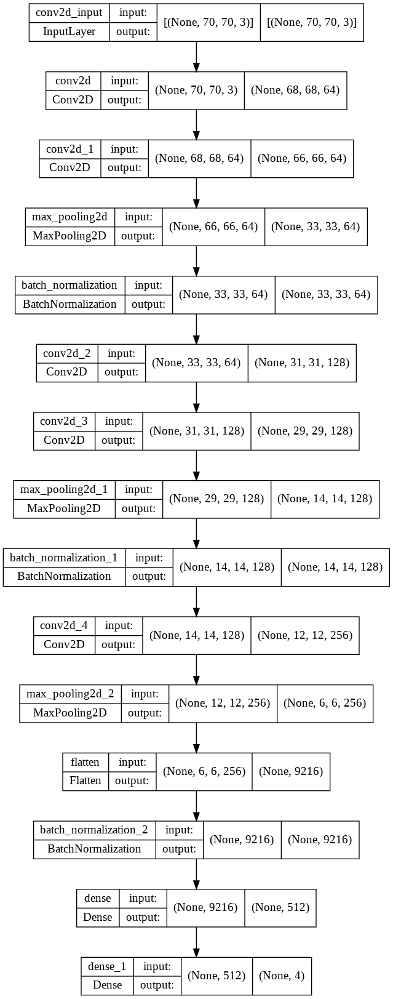

In [ ]:
# Plotting the CNN Model along with the Shapes and Each Layer Name
plot_model(CNN_Model1, show_shapes=True, show_layer_names=True)

Using "CNN Model - 1" as DL Classification Algorithm:- 


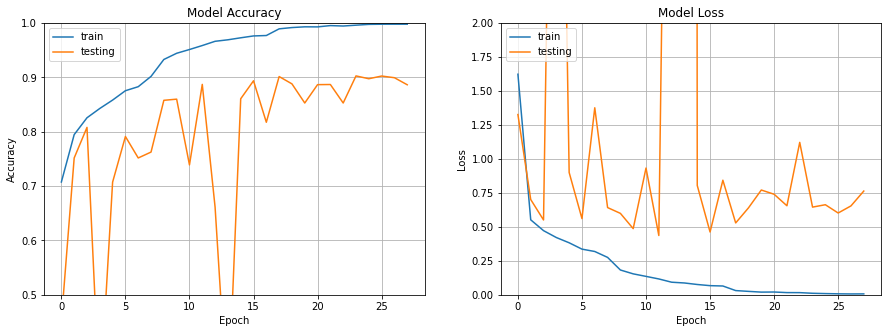

133/133 [==============================] - 3s 19ms/step - loss: 0.7633 - accuracy: 0.8864

Test loss: 0.7633 ~ 76.33%
Test accuracy: 0.8864 ~ 88.64%

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.96      0.88       708
           1       0.90      0.79      0.84      1208
           2       0.90      0.91      0.90      2039
           3       0.95      0.94      0.94       278

    accuracy                           0.89      4233
   macro avg       0.89      0.90      0.89      4233
weighted avg       0.89      0.89      0.89      4233


Confusion Matrix:


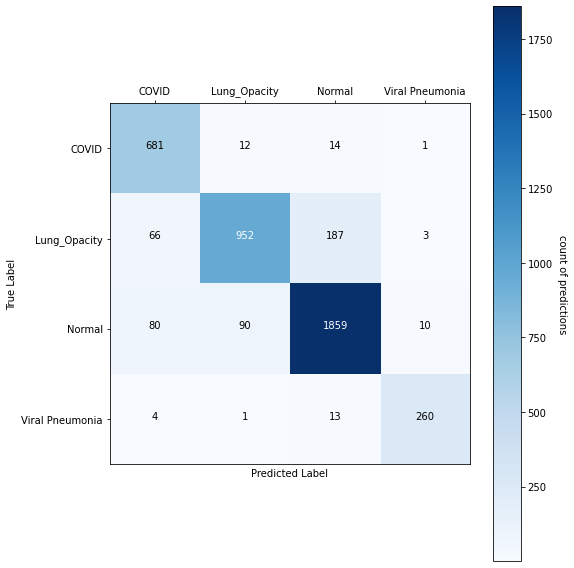



Model Predicted labels vs Original Labels: 


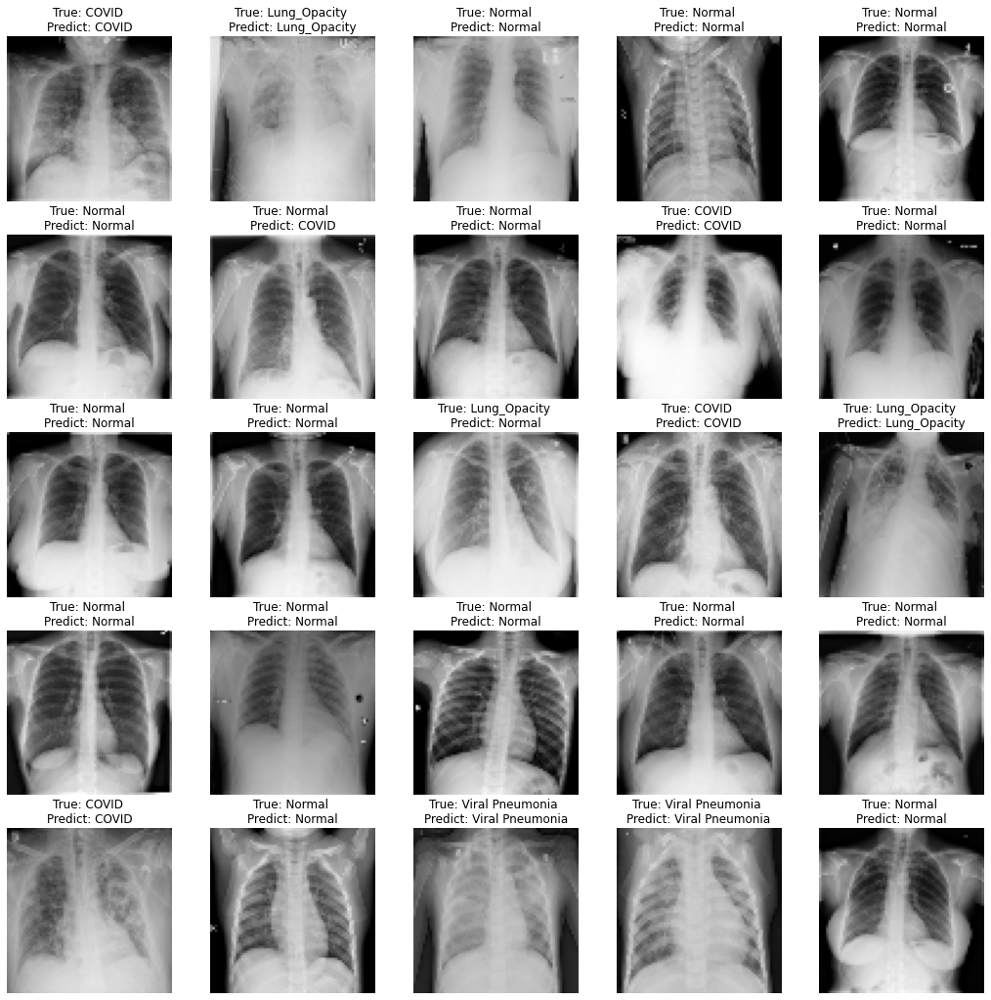

In [ ]:
# Evaluating & Predicting from the First CNN Model
CNN_model = CNN_Model1
print("Using \"CNN Model - 1\" as DL Classification Algorithm:- ")
# Calling the function in order to plot the Loss and Accuracy
# of Model in Training and Validation Set on Each Epoch
plotmodelhistory(CNN1_history)
# Calling the Function to Evaluate, Generate Classification Report,
# Plotting Confusion Matrix and Checking the Predictions
model_eval(CNN_model, X_test, y_test_cat)

# ***CNN Model - 2***

In [ ]:
# Bulding the Second CNN Model : CNN_Model2

# Sequential model is used, since implementation is easy 
# And you only need to add one layer at a time , starting from input
CNN_Model2 = Sequential()

# Using Convolutional Layer with 32 filters where each filter from 32 will transform a part of image, 
# kernel size is (3,3), input shape with 70x70x3 and 'relu' activation function
CNN_Model2.add(Conv2D(32, (3, 3), activation="relu", input_shape=(70, 70, 3)))
# Using MaxPooling layer which acts as a Downsampling Filter 
# We used MaxPool2D since the data (image) is 2D
# Since we defined pool_size as 2,2 thus, it will look 2 neighboring pixels and 
# it will pick the maximal value
CNN_Model2.add(MaxPool2D(pool_size = (2, 2)))
# Using Convolutional Layer with 32 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model2.add(Conv2D(32, (3, 3), activation="relu"))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model2.add(MaxPool2D(pool_size = (2, 2)))

# Using Convolutional Layer with 64 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model2.add(Conv2D(64, (3, 3), activation="relu"))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model2.add(MaxPool2D(pool_size = (2, 2)))
# Using Convolutional Layer with 64 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model2.add(Conv2D(64, (3, 3), activation="relu"))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model2.add(MaxPool2D(pool_size = (2, 2)))

# Using Flatten Layer to convert the final feature map into a single 1-D vector 
CNN_Model2.add(Flatten())
# Using Dense Layer to classify the vectors into 128 classes with 'relu' activation function
CNN_Model2.add(Dense(activation = 'relu', units = 128))
# Using Dense Layer to classify the vectors into 64 classes with 'relu' activation function
CNN_Model2.add(Dense(activation = 'relu', units = 64))
# Classified the output to the final 4 classes on which we have to classify using 'sigmoid' activation function
CNN_Model2.add(Dense(activation = 'sigmoid', units = 4))

# Printing the CNN Model - 2 summary
CNN_Model2.summary()

# Compiled the CNN model with 'Adam' optimizer
# loss function will be categorical cross-entropy
# Evaluation parameter will be accuracy
# Thus After each Epoch, loss & accuracy will be printed
CNN_Model2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_19 (Conv2D)          (None, 68, 68, 32)        896       
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 34, 34, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_21 (Conv2D)          (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 7, 7, 64)        

In [ ]:
# Callback : Model Checkpoint
# Here, if current val_accuracy is greater than max val_accuracy, 
# then the trained model till that Epoch will be saved to the specified path
modelCheckpoint = ModelCheckpoint(monitor="val_accuracy", 
                      filepath="/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model2.h5", 
                      verbose=1, 
                      save_best_only=True, 
                      mode='auto') 

# Creating a list of all 3 callbacks in order
# to use it on CNN model while training
callBack = [learningRateReduction, earlyStopping, modelCheckpoint]

In [ ]:
# Training the CNN Model - 2
# Here x is X_train
# y is y_train_cat
# No. of epochs is 50
# At a time, a batch of 16 images will be processed
# Validation set is 'x_test' and 'y_test_cat'
# And callback parameters will be taken from 'callBack' array
CNN2_history=CNN_Model2.fit(X_train,
                  y_train_cat,
                  epochs=50,
                  batch_size=16,
                  validation_data=(X_test,y_test_cat),
                  verbose=1,
                  callbacks=callBack)

Epoch 1/50
1059/1059 [==============================] - ETA: 0s - loss: 0.3637 - accuracy: 0.6627
Epoch 1: val_accuracy improved from -inf to 0.73210, saving model to /content/drive/MyDrive/BestModel/CNN_Model2.h5
1059/1059 [==============================] - 22s 12ms/step - loss: 0.3637 - accuracy: 0.6627 - val_loss: 0.2972 - val_accuracy: 0.7321 - lr: 0.0010
Epoch 2/50
1054/1059 [============================>.] - ETA: 0s - loss: 0.2785 - accuracy: 0.7556
Epoch 2: val_accuracy improved from 0.73210 to 0.75998, saving model to /content/drive/MyDrive/BestModel/CNN_Model2.h5
1059/1059 [==============================] - 11s 10ms/step - loss: 0.2783 - accuracy: 0.7556 - val_loss: 0.2652 - val_accuracy: 0.7600 - lr: 0.0010
Epoch 3/50
1058/1059 [============================>.] - ETA: 0s - loss: 0.2391 - accuracy: 0.7967
Epoch 3: val_accuracy improved from 0.75998 to 0.80676, saving model to /content/drive/MyDrive/BestModel/CNN_Model2.h5
1059/1059 [==============================] - 12s 11ms/st

In [ ]:
# Loading the Second CNN Model
CNN_Model2 = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model2.h5')

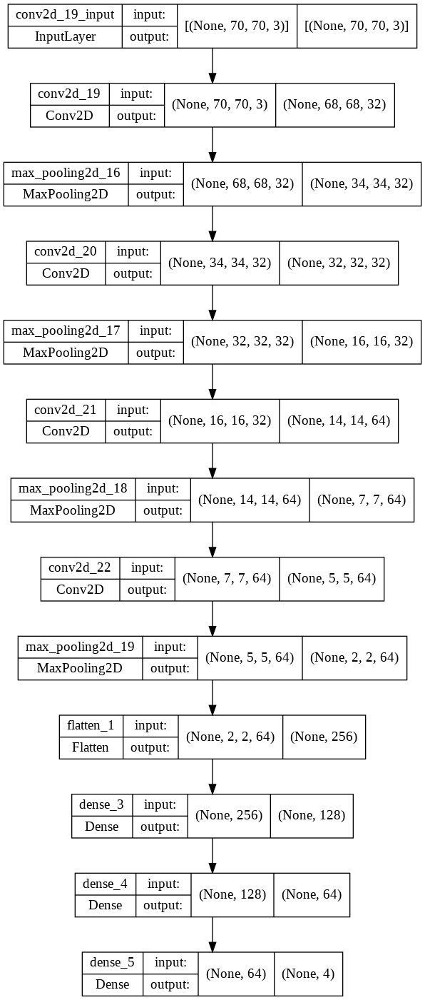

In [ ]:
# Plotting the CNN Model along with the Shapes and Each Layer Name
plot_model(CNN_Model2, show_shapes=True, show_layer_names=True)

Using "CNN Model - 2" as DL Classification Algorithm:- 


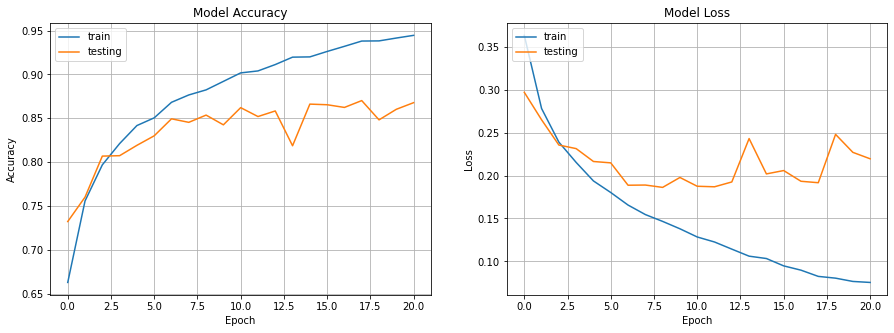

133/133 [==============================] - 1s 7ms/step - loss: 0.2197 - accuracy: 0.8677

Test loss: 0.2197 ~ 21.97%
Test accuracy: 0.8677 ~ 86.77%

Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.88      0.84       734
           1       0.85      0.81      0.83      1193
           2       0.90      0.89      0.90      2048
           3       0.94      0.90      0.92       258

    accuracy                           0.87      4233
   macro avg       0.87      0.87      0.87      4233
weighted avg       0.87      0.87      0.87      4233


Confusion Matrix:


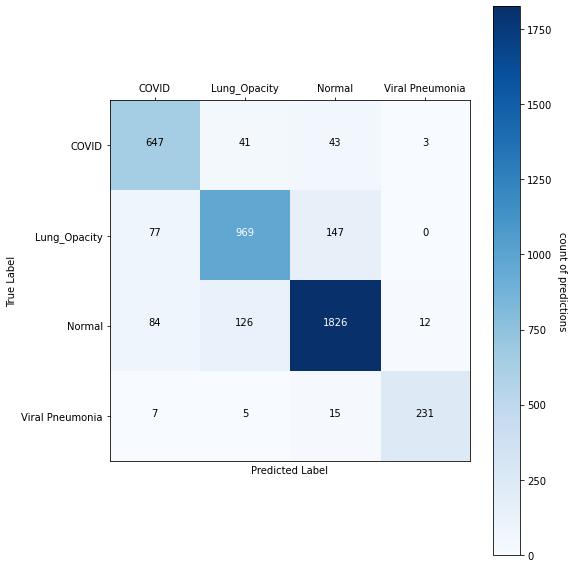



Model Predicted labels vs Original Labels: 


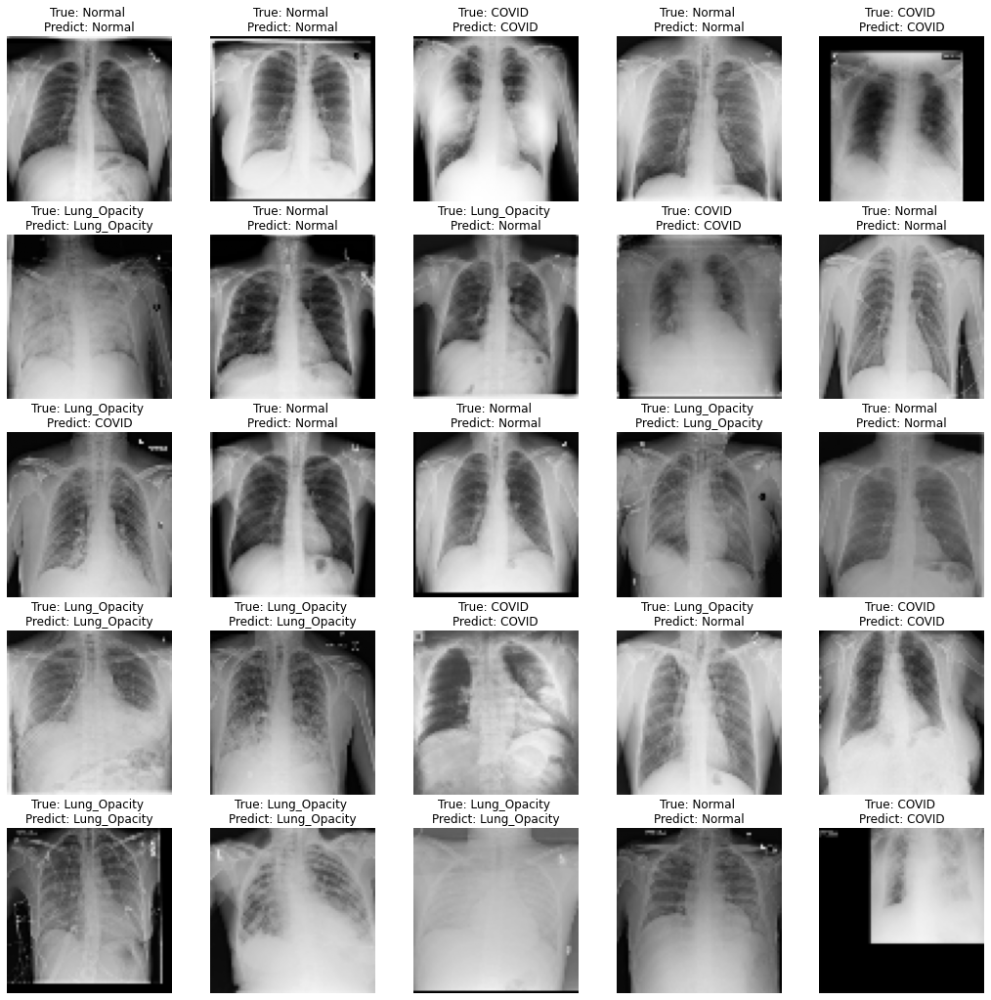

In [ ]:
# Evaluating & Predicting from the Second CNN Model
CNN_model = CNN_Model2
print("Using \"CNN Model - 2\" as DL Classification Algorithm:- ")
# Calling the function in order to plot the Loss and Accuracy
# of Model in Training and Validation Set on Each Epoch
plotmodelhistory(CNN2_history)
# Calling the Function to Evaluate, Generate Classification Report,
# Plotting Confusion Matrix and Checking the Predictions
model_eval(CNN_model, X_test, y_test_cat)

# ***CNN Model - 3***

In [ ]:
# Bulding the Third CNN Model : CNN_Model3

# Sequential model is used, since implementation is easy 
# And you only need to add one layer at a time , starting from input
CNN_Model3 = Sequential()

# Using Convolutional Layer with 128 filters where each filter from 128 will transform a part of image, 
# kernel size is (3,3), input shape with 70x70x3 and 'relu' activation function
CNN_Model3.add(Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu', input_shape = (70, 70, 3)))
# Using MaxPooling layer which acts as a Downsampling Filter 
# We used MaxPool2D since the data (image) is 2D
# Since we defined pool_size as 2,2 thus, it will look 2 neighboring pixels and 
# it will pick the maximal value
CNN_Model3.add(MaxPool2D((2, 2)))
# Using Dropout Layer to reduce overfitting by dropping out some neural units
# (frequency less than 0.3) from our network in order to regularize the model
CNN_Model3.add(layers.Dropout(0.3))

# Using Convolutional Layer with 64 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model3.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
# Using MaxPooling layer 2D since image is 2D, with 2,2 as neighboring pixels
CNN_Model3.add(MaxPool2D((2, 2)))
# Using Dropout Layer by dropping neural units with frequency less than 0.5
CNN_Model3.add(layers.Dropout(0.5))

# Using Convolutional Layer with 64 filters, kernel size is (3,3) and 'relu' activation function
CNN_Model3.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))

# Using Flatten Layer to convert the final feature map into a single 1-D vector 
CNN_Model3.add(Flatten())
# Using Dense Layer to classify the vectors into 128 classes with 'relu' activation function
CNN_Model3.add(Dense(units = 128, activation = 'relu'))
# Using Dense Layer to classify the vectors into 64 classes with 'relu' activation function
CNN_Model3.add(Dense(units = 64, activation = 'relu'))
# Using Dropout Layer by dropping neural units with frequency less than 0.2
CNN_Model3.add(layers.Dropout(0.2))
# Classified the output to the final 4 classes on which we have to classify using 'sigmoid' activation function
CNN_Model3.add(Dense(units = 4, activation = 'sigmoid'))

# Printing the CNN Model - 3 summary
CNN_Model3.summary()

# Compiled the CNN model with 'Adam' optimizer
# loss function will be categorical cross-entropy
# Evaluation parameter will be accuracy
# Thus After each Epoch, loss & accuracy will be printed
CNN_Model3.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 68, 68, 128)       3584      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 34, 34, 128)      0         
 2D)                                                             
                                                                 
 dropout_9 (Dropout)         (None, 34, 34, 128)       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 64)        73792     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 16, 16, 64)       0         
 2D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 16, 16, 64)       

In [ ]:
# Callback : Model Checkpoint
# Here, if current val_accuracy is greater than max val_accuracy, 
# then the trained model till that Epoch will be saved to the specified path
modelCheckpoint = ModelCheckpoint(monitor="val_accuracy", 
                      filepath="/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model3.h5", 
                      verbose=1, 
                      save_best_only=True, 
                      mode='auto') 

# Creating a list of all 3 callbacks in order
# to use it on CNN model while training
callBack = [learningRateReduction, earlyStopping, modelCheckpoint]

In [ ]:
# Training the CNN Model - 3
# Here x is X_train
# y is y_train_cat
# No. of epochs is 50
# At a time, a batch of 16 images will be processed
# Validation set is 'x_test' and 'y_test_cat'
# And callback parameters will be taken from 'callBack' array
CNN3_history = CNN_Model3.fit(X_train, 
                              y_train_cat, 
                              epochs = 50, 
                              batch_size = 256,  
                              validation_data = (X_test, y_test_cat), 
                              verbose=1, 
                              callbacks = callBack) 

Epoch 1/50
66/67 [============================>.] - ETA: 0s - loss: 0.5037 - accuracy: 0.5009
Epoch 1: val_accuracy improved from -inf to 0.60265, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model3.h5
67/67 [==============================] - 16s 209ms/step - loss: 0.5035 - accuracy: 0.5011 - val_loss: 0.4381 - val_accuracy: 0.6026 - lr: 0.0010
Epoch 2/50
66/67 [============================>.] - ETA: 0s - loss: 0.3898 - accuracy: 0.6362
Epoch 2: val_accuracy improved from 0.60265 to 0.67706, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model3.h5
67/67 [==============================] - 14s 203ms/step - loss: 0.3896 - accuracy: 0.6365 - val_loss: 0.3624 - val_accuracy: 0.6771 - lr: 0.0010
Epoch 3/50
66/67 [============================>.] - ETA: 0s - loss: 0.3287 - accuracy: 0.7073
Epoch 3: val_accuracy improved from 0.67706 to 0.70706, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/C

In [ ]:
# Loading the Third CNN Model
CNN_Model3 = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/CNN_Model3.h5')

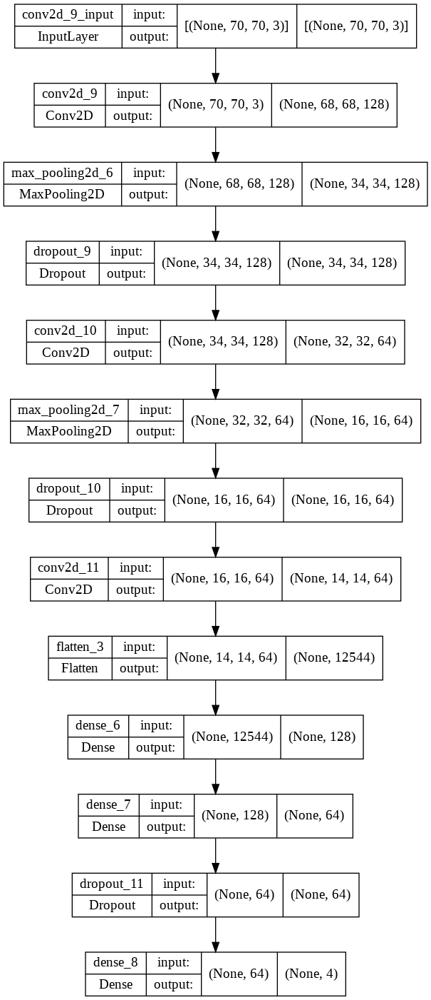

In [ ]:
# Plotting the CNN Model along with the Shapes and Each Layer Name
plot_model(CNN_Model3, show_shapes=True, show_layer_names=True)

Using "CNN Model - 3" as DL Classification Algorithm:- 


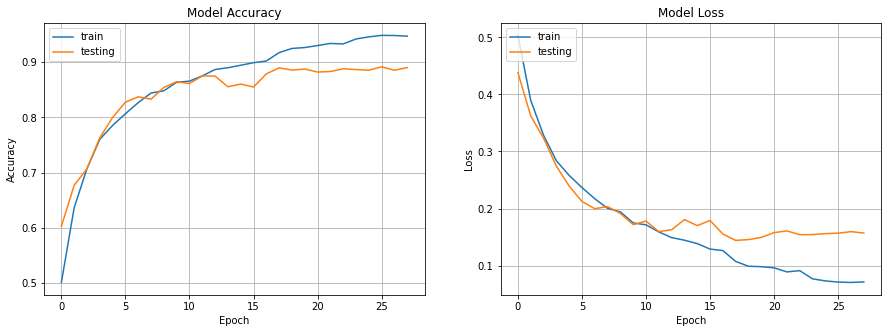

133/133 [==============================] - 2s 14ms/step - loss: 0.1569 - accuracy: 0.8916

Test loss: 0.1569 ~ 15.69%
Test accuracy: 0.8916 ~ 89.16%

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       728
           1       0.87      0.81      0.84      1188
           2       0.89      0.94      0.91      2049
           3       0.94      0.95      0.95       268

    accuracy                           0.89      4233
   macro avg       0.91      0.89      0.90      4233
weighted avg       0.89      0.89      0.89      4233


Confusion Matrix:


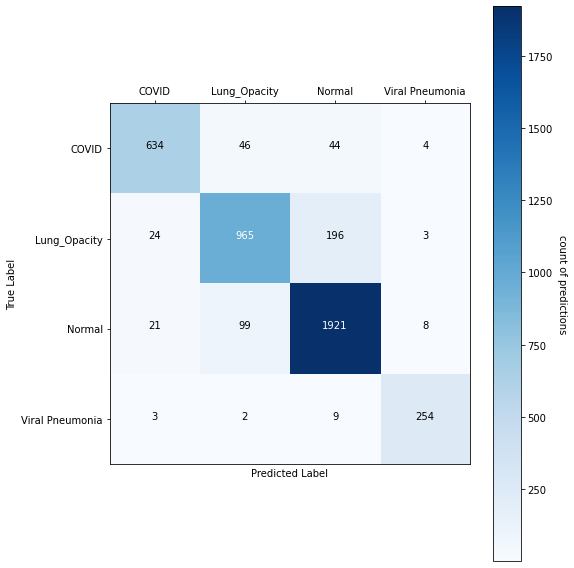



Model Predicted labels vs Original Labels: 


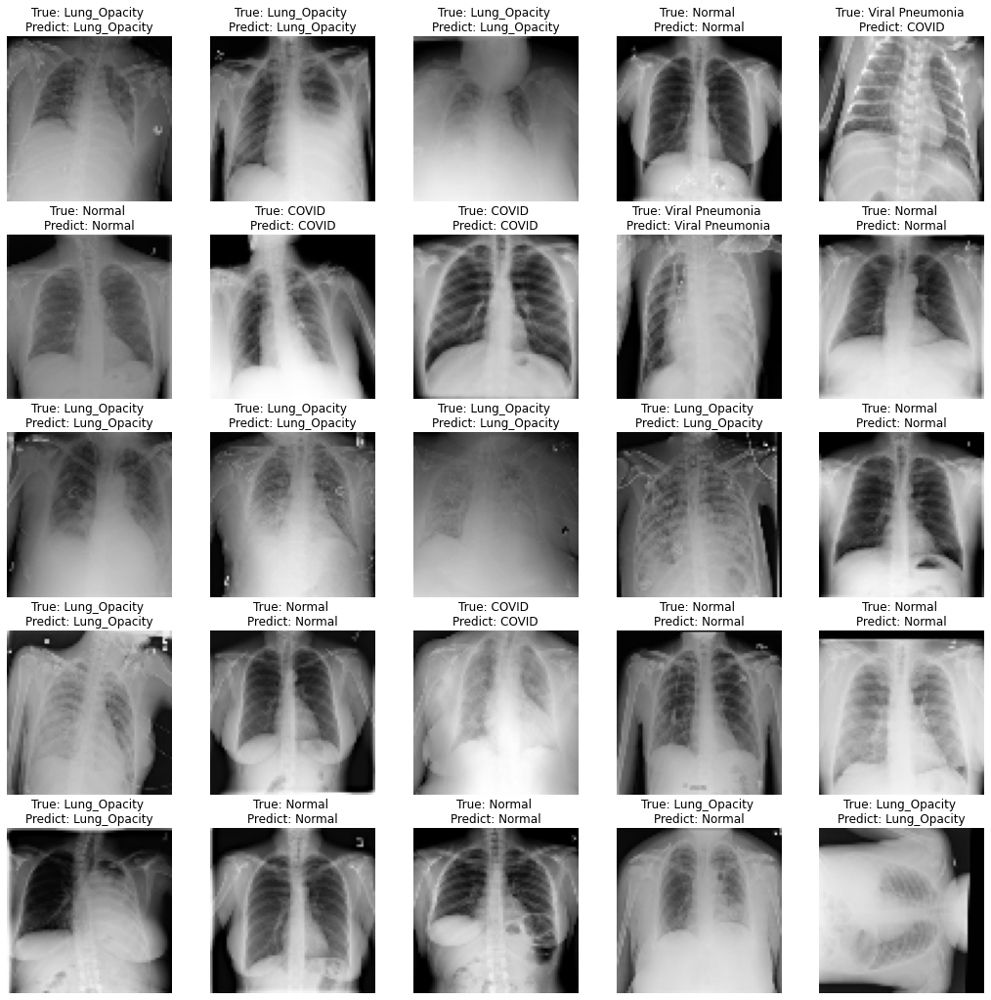

In [ ]:
# Evaluating & Predicting from the Third CNN Model
CNN_model = CNN_Model3
print("Using \"CNN Model - 3\" as DL Classification Algorithm:- ")
# Calling the function in order to plot the Loss and Accuracy
# of Model in Training and Validation Set on Each Epoch
plotmodelhistory(CNN3_history)
# Calling the Function to Evaluate, Generate Classification Report,
# Plotting Confusion Matrix and Checking the Predictions
model_eval(CNN_model, X_test, y_test_cat)

# ***CNN Model: Resnet - 152 (V2)***

In [ ]:
# Importing the Resnet Model (Resnet-152 V2)

# Here we specified 'include_top=True' as we have specified our input shape as (70,70,3)
# We also specified 'input_tensor=None' and stated the 4 classes
# Average pooling is applied and the model weights will be none
Resnet_Model= tf.keras.applications.ResNet152V2(
                    include_top=True,
                    weights=None,
                    input_tensor=None,
                    input_shape=(70,70,3),
                    pooling='avg',
                    classes=4)

# Printing the Resnet Model summary
Resnet_Model.summary()

# Compiled the Resnet Model with 'Adam' optimizer with learning rate of 0.001
# loss function will be categorical cross-entropy
# Evaluation parameter will be accuracy
# Thus After each Epoch, loss & accuracy will be printed
Resnet_Model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

Model: "resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 70, 70, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 76, 76, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 35, 35, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 37, 37, 64)   0           ['conv1_conv[0][0]']             
                                                                                        

In [ ]:
# Callback : Model Checkpoint
# Here, if current val_accuracy is greater than max val_accuracy, 
# then the trained model till that Epoch will be saved to the specified path
modelCheckpoint = ModelCheckpoint(monitor="val_accuracy", 
                      filepath="/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Resnet_Model2.h5", 
                      verbose=1, 
                      save_best_only=True, 
                      mode='auto') 

# Creating a list of all 3 callbacks in order
# to use it on CNN model while training
callBack = [learningRateReduction, earlyStopping, modelCheckpoint]

In [ ]:
# Loading the Resnet Model (Resnet-152 V2)
Resnet_Model = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Resnet_Model.h5')

In [ ]:
# Training the Resnet Model (Resnet-152 V2)
# Here x is X_train
# y is y_train_cat
# No. of epochs is 50
# At a time, a batch of 16 images will be processed
# Validation set is 'x_test' and 'y_test_cat'
# And callback parameters will be taken from 'callBack' array
Resnet_history=Resnet_Model.fit(X_train,
                  y_train_cat,
                  epochs=50,
                  batch_size=16,
                  validation_data=(X_test,y_test_cat),
                  verbose=1,
                  callbacks=callBack)

Epoch 1/50
1059/1059 [==============================] - ETA: 0s - loss: 0.2313 - accuracy: 0.9170
Epoch 1: val_accuracy improved from -inf to 0.88448, saving model to /content/drive/MyDrive/BestModel/Resnet_Model2.h5
1059/1059 [==============================] - 367s 326ms/step - loss: 0.2313 - accuracy: 0.9170 - val_loss: 0.3062 - val_accuracy: 0.8845 - lr: 0.0010
Epoch 2/50
1059/1059 [==============================] - ETA: 0s - loss: 0.2021 - accuracy: 0.9266
Epoch 2: val_accuracy did not improve from 0.88448
1059/1059 [==============================] - 352s 333ms/step - loss: 0.2021 - accuracy: 0.9266 - val_loss: 0.7941 - val_accuracy: 0.6567 - lr: 0.0010
Epoch 3/50
1059/1059 [==============================] - ETA: 0s - loss: 0.1852 - accuracy: 0.9311
Epoch 3: val_accuracy did not improve from 0.88448
1059/1059 [==============================] - 333s 314ms/step - loss: 0.1852 - accuracy: 0.9311 - val_loss: 0.7241 - val_accuracy: 0.7590 - lr: 0.0010
Epoch 4/50
1059/1059 [=============

In [ ]:
# Loading the Resnet Model (Resnet-152 V2)
Resnet_Model = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Resnet_Model.h5')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.529996 to fit



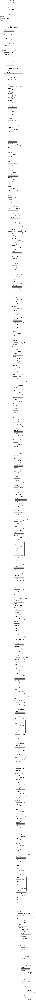

In [ ]:
# Plotting the Resnet Model (Resnet-152 V2) along with the Shapes and Each Layer Name
plot_model(Resnet_Model, show_shapes=True, show_layer_names=True)

Using "Resnet Model - 2" as DL Classification Algorithm:- 


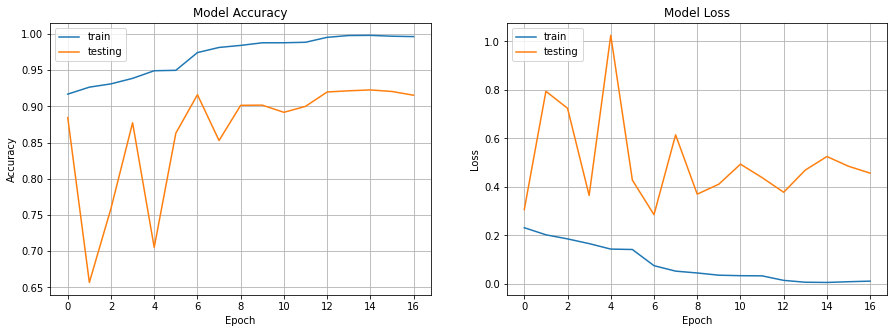

133/133 [==============================] - 17s 122ms/step - loss: 0.4564 - accuracy: 0.9154

Test loss: 0.4564 ~ 45.64%
Test accuracy: 0.9154 ~ 91.54%

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       776
           1       0.87      0.87      0.87      1174
           2       0.93      0.91      0.92      2011
           3       0.96      0.98      0.97       272

    accuracy                           0.92      4233
   macro avg       0.92      0.93      0.93      4233
weighted avg       0.92      0.92      0.92      4233


Confusion Matrix:


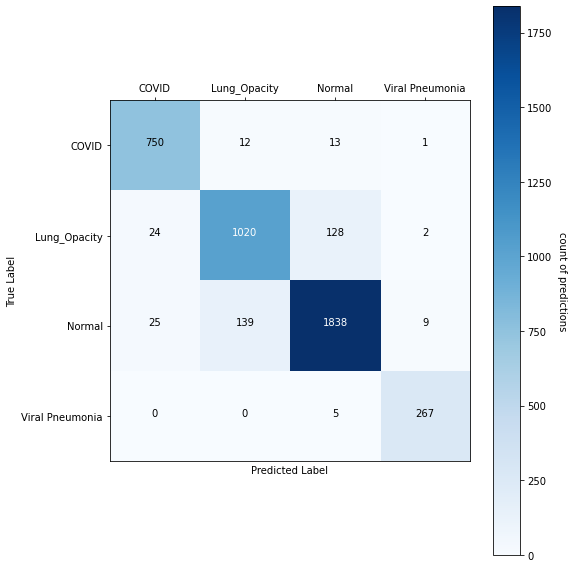



Model Predicted labels vs Original Labels: 


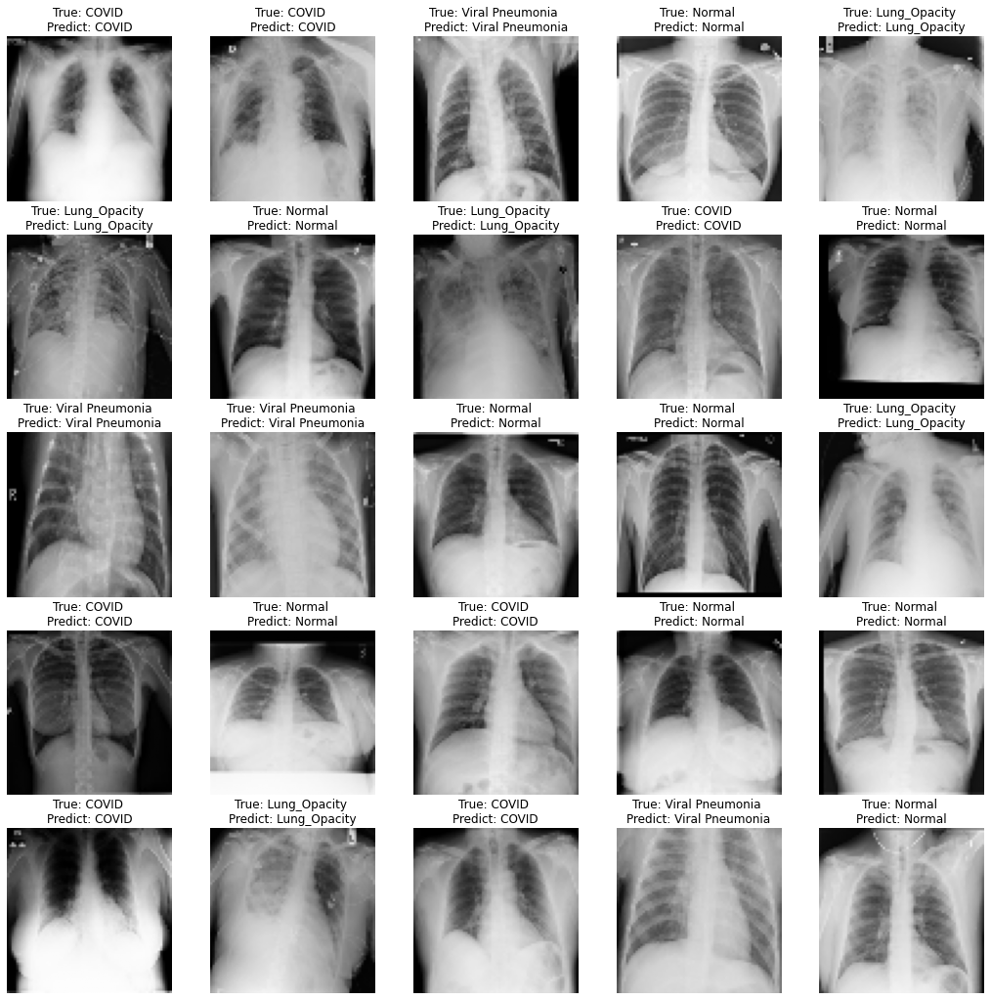

In [ ]:
# Evaluating & Predicting from the Resnet Model (Resnet-152 V2)
CNN_model = Resnet_Model
print("Using \"Resnet Model\" as DL Classification Algorithm:- ")
# Calling the function in order to plot the Loss and Accuracy
# of Model in Training and Validation Set on Each Epoch
plotmodelhistory(Resnet_history)
# Calling the Function to Evaluate, Generate Classification Report,
# Plotting Confusion Matrix and Checking the Predictions
model_eval(CNN_model, X_test, y_test_cat)

# ***CNN Model: Densenet - 121***

In [ ]:
# Importing the Densenet Model (Densenet-121)

# Here we specified 'include_top=True' as we have specified our input shape as (70,70,3)
# We also specified 'input_tensor=None' and stated the 4 classes
# Max pooling is applied and the model weights will be none
Densenet_Model = tf.keras.applications.DenseNet121(
                    include_top=True,
                    weights=None,
                    input_tensor=None,
                    input_shape=(70,70,3),
                    pooling='max',
                    classes=4)

# Printing the Densenet Model summary
Densenet_Model.summary()

# Compiled the Densenet Model with 'Adam' optimizer with learning rate of 0.001
# loss function will be categorical cross-entropy
# Evaluation parameter will be accuracy
# Thus After each Epoch, loss & accuracy will be printed
Densenet_Model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 70, 70, 3)]  0           []                               
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 76, 76, 3)   0           ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 35, 35, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 35, 35, 64)   256         ['conv1/conv[0][0]']             
                                                                                        

In [ ]:
# Callback : Model Checkpoint
# Here, if current val_accuracy is greater than max val_accuracy, 
# then the trained model till that Epoch will be saved to the specified path
modelCheckpoint = ModelCheckpoint(monitor="val_accuracy", 
                      filepath="/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Densenet_Model.h5", 
                      verbose=1, 
                      save_best_only=True, 
                      mode='auto') 

# Creating a list of all 3 callbacks in order
# to use it on CNN model while training
callBack = [learningRateReduction, earlyStopping, modelCheckpoint]

In [ ]:
# Training the Densenet Model (Densenet-121)
# Here x is X_train
# y is y_train_cat
# No. of epochs is 50
# At a time, a batch of 16 images will be processed
# Validation set is 'x_test' and 'y_test_cat'
# And callback parameters will be taken from 'callBack' array
Densenet_history = Densenet_Model.fit(
                  X_train,
                  y_train_cat,
                  epochs=50,
                  batch_size=32,
                  validation_data=(X_test,y_test_cat),
                  verbose=1,
                  callbacks=callBack)

Epoch 1/50
530/530 [==============================] - ETA: 0s - loss: 0.6523 - accuracy: 0.7480
Epoch 1: val_accuracy improved from -inf to 0.53815, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Densenet_Model.h5
530/530 [==============================] - 117s 173ms/step - loss: 0.6523 - accuracy: 0.7480 - val_loss: 1.0159 - val_accuracy: 0.5382 - lr: 0.0010
Epoch 2/50
530/530 [==============================] - ETA: 0s - loss: 0.4693 - accuracy: 0.8225
Epoch 2: val_accuracy improved from 0.53815 to 0.68155, saving model to /content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Densenet_Model.h5
530/530 [==============================] - 86s 162ms/step - loss: 0.4693 - accuracy: 0.8225 - val_loss: 0.8246 - val_accuracy: 0.6815 - lr: 0.0010
Epoch 3/50
530/530 [==============================] - ETA: 0s - loss: 0.4000 - accuracy: 0.8494
Epoch 3: val_accuracy improved from 0.68155 to 0.78526, saving model to /content/drive/MyDrive/COVID-19_Radiography_

In [ ]:
# Loading the Densenet Model (Densenet-121)
Densenet_Model = tf.keras.models.load_model('/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Densenet_Model.h5')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.690719 to fit



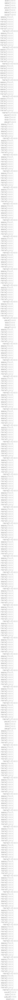

In [ ]:
# Plotting the Densenet Model (Densenet-121) along with the Shapes and Each Layer Name
plot_model(Densenet_Model, show_shapes=True, show_layer_names=True)

Using "Densenet Model" as DL Classification Algorithm:- 


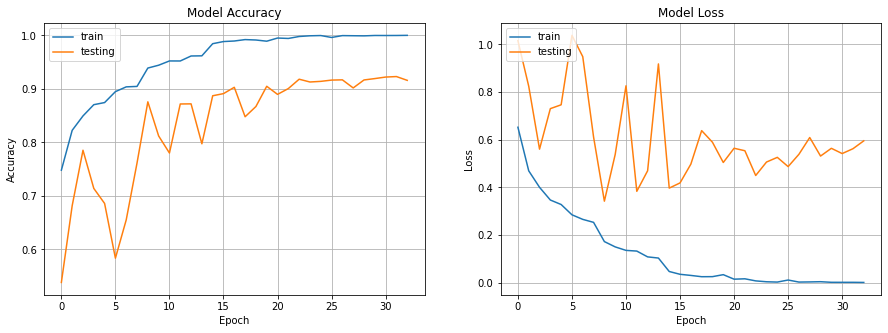

133/133 [==============================] - 9s 50ms/step - loss: 0.5622 - accuracy: 0.9230

Test loss: 0.5622 ~ 56.22%
Test accuracy: 0.9230 ~ 92.30%

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       732
           1       0.91      0.85      0.88      1222
           2       0.92      0.95      0.93      2028
           3       0.98      0.94      0.96       251

    accuracy                           0.92      4233
   macro avg       0.94      0.93      0.93      4233
weighted avg       0.92      0.92      0.92      4233


Confusion Matrix:


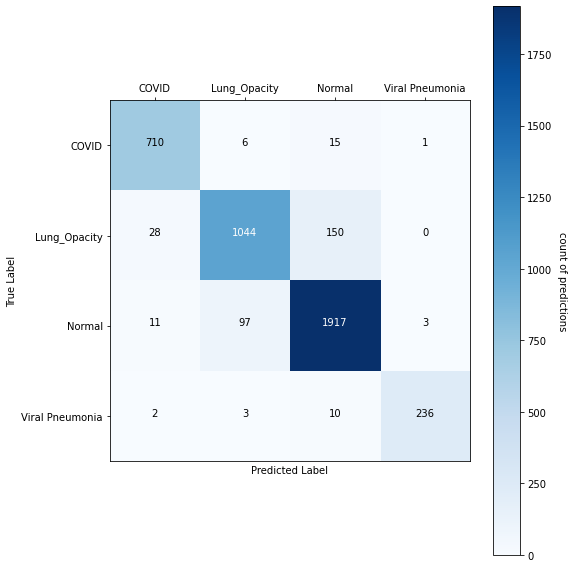



Model Predicted labels vs Original Labels: 


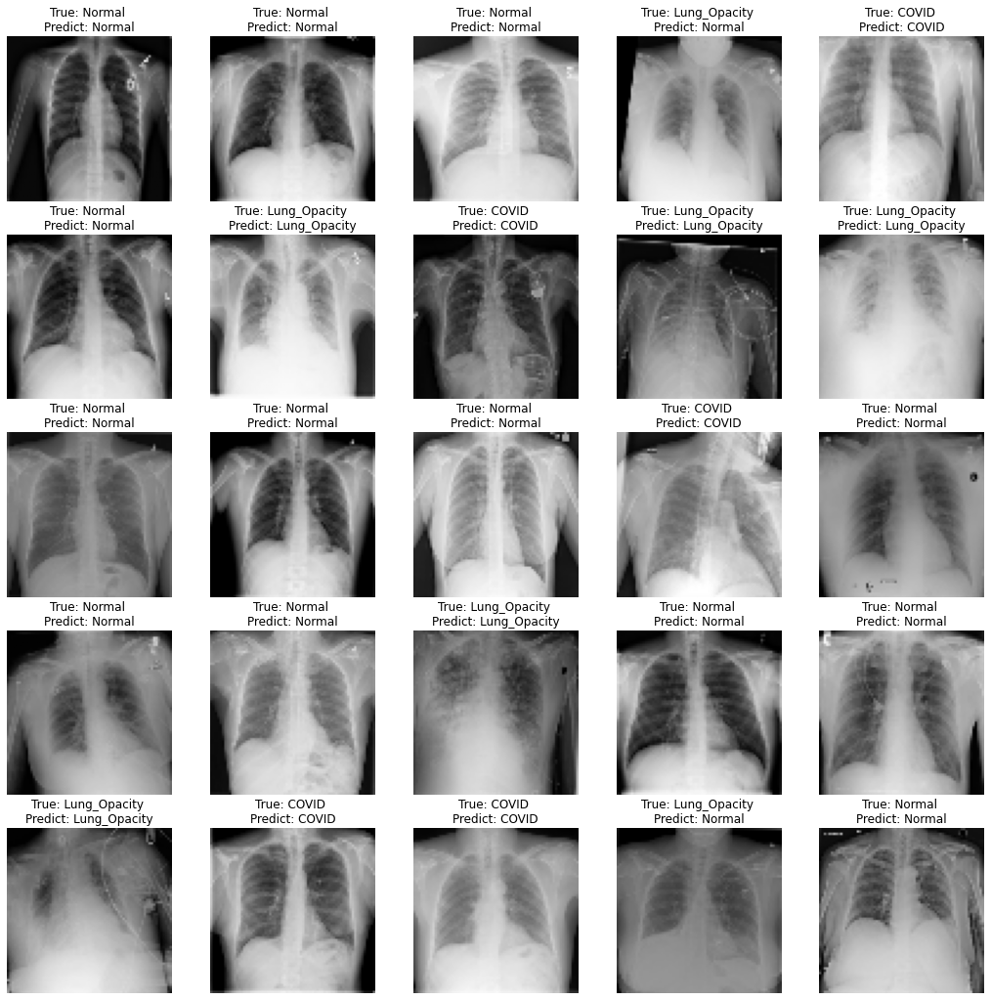

In [ ]:
# Evaluating & Predicting from the Densenet Model (Densenet-121)
CNN_model = Densenet_Model
print("Using \"Densenet Model\" as DL Classification Algorithm:- ")
# Calling the function in order to plot the Loss and Accuracy
# of Model in Training and Validation Set on Each Epoch
plotmodelhistory(Densenet_history)
# Calling the Function to Evaluate, Generate Classification Report,
# Plotting Confusion Matrix and Checking the Predictions
model_eval(CNN_model, X_test, y_test_cat)

# **Plotting Accuracy of All CNN Models**

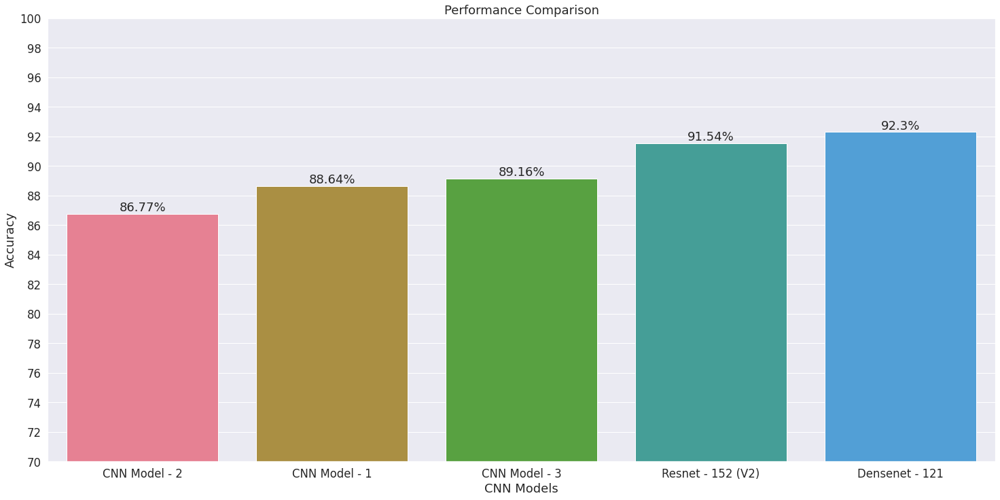

In [ ]:
# Plotting Accuracy of All Models

# This List Consists of Name of the Models
CNN_models = ['CNN Model - 2', 'CNN Model - 1', 'CNN Model - 3', 'Resnet - 152 (V2)', 'Densenet - 121']
# This List Consists of the Accuracy of the Respective Models
accuracy = [86.77, 88.64, 89.16, 91.54, 92.30]

# Setting the Font Scale as 1.5 for the text in the graph
sns.set(font_scale = 1.5, palette="husl")
# Plotting the Graph with figure size 25x12
plt.figure(figsize=(25,12))
# Plotting the graph as Bar Graph with X-axis as 'CNN_models' and Y-axis as 'accuracy'
sns.barplot(x=CNN_models, y=accuracy)

for i in range(len(CNN_models)):
    value = str(accuracy[i]) + "%"
    # Plotting the Accuracy % on top of each bar
    plt.text(i, accuracy[i], value, ha="center", va="bottom")
# Setting the title of the Graph as 'Performance Comparison'
plt.title('Performance Comparison')
# Setting the Y-axis Label as 'Accuracy'
plt.ylabel('Accuracy') 
# Setting the X-axis Label as 'CNN Models'
plt.xlabel('CNN Models')
# Limiting the Y-axis value form 70-100 (both inclusive)
plt.ylim([70,100])
# Setting the Scale of Y-axis to '2', 
# thus the value on Y-axis will be incremented by 2
plt.yticks(np.arange(70, 101, 2))

# Displaying the Bar Chart
plt.show()

# **Working with Traditional ML Models**

# **Importing ML Algorithms Libraries**

In [ ]:
!pip3 install catboost

     |████████████████████████████████| 76.1 MB 66 kB/s 


In [ ]:
# Importing Traditional ML Algorithms
import pickle
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB, ComplementNB, BernoulliNB
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score

# **Pre-Processing**

In [ ]:
# Reshaping Training and Testing Set
# For Traditional ML Algorithms
nsamples, nx, ny, nrgb = X_train.shape
X_train_ML = X_train.reshape((nsamples, nx*ny*nrgb))

nsamples, nx, ny, nrgb = X_test.shape
X_test_ML = X_test.reshape((nsamples, nx*ny*nrgb))

# **Function for Predicting & Evaluating ML Model**

In [ ]:
# Function for Predicting & Evaluation ML Model
def model_eval_ML(model, X_test_ML, y_test, X_test):
  y_pred = model.predict(X_test_ML)
  print("\nAccuracy Score: {:.4f} ~ {:.2f}%".format(accuracy_score(y_test, y_pred), accuracy_score(y_test, y_pred)*100))
  print("\nClassification Report:")
  print(classification_report(y_test, y_pred))
  # Creating Confusion Matrix
  print("\nConfusion Matrix:")
  cm = confusion_matrix(y_test, y_pred) 
  thresh = cm.max() / 2.

  fig, ax = plt.subplots(figsize=(10,10))
  im, cbar = heatmap(cm, Files, Files, ax=ax,
                    cmap=plt.cm.Blues, cbarlabel="count of predictions")
  texts = annotate_heatmap(im, data=cm, threshold=thresh)

  fig.tight_layout()
  plt.show()
  
  # Checking the Predictions computed from the Model
  print("\n\nModel Predicted labels vs Original Labels: ")
  fig, axes = plt.subplots(5, 5, figsize=(18, 18))
  axes = axes.ravel()

  for i in np.arange(0, 5*5):
      axes[i].imshow(X_test[i])
      axes[i].set_title("True: %s \nPredict: %s" % (Files[y_test[i]], Files[y_pred[i]]))
      axes[i].axis('off')

# ***ML Model: Logistic Regression***


Using "Logistic Regression" as Machine Learning Classification Algorithm:- 


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,



Accuracy Score: 0.7120 ~ 71.20%

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.59      0.59       727
           1       0.64      0.66      0.65      1191
           2       0.79      0.78      0.78      2058
           3       0.81      0.79      0.80       257

    accuracy                           0.71      4233
   macro avg       0.71      0.70      0.70      4233
weighted avg       0.71      0.71      0.71      4233


Confusion Matrix:


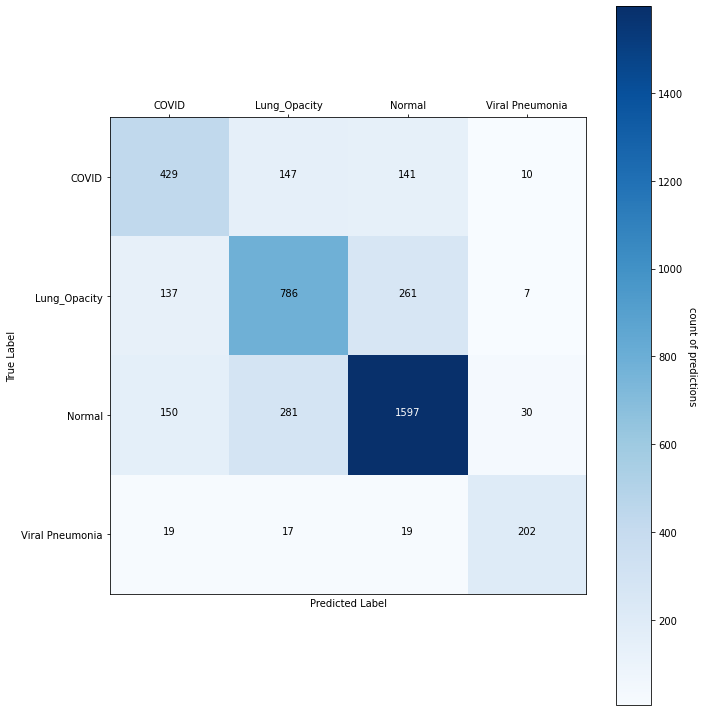



Model Predicted labels vs Original Labels: 


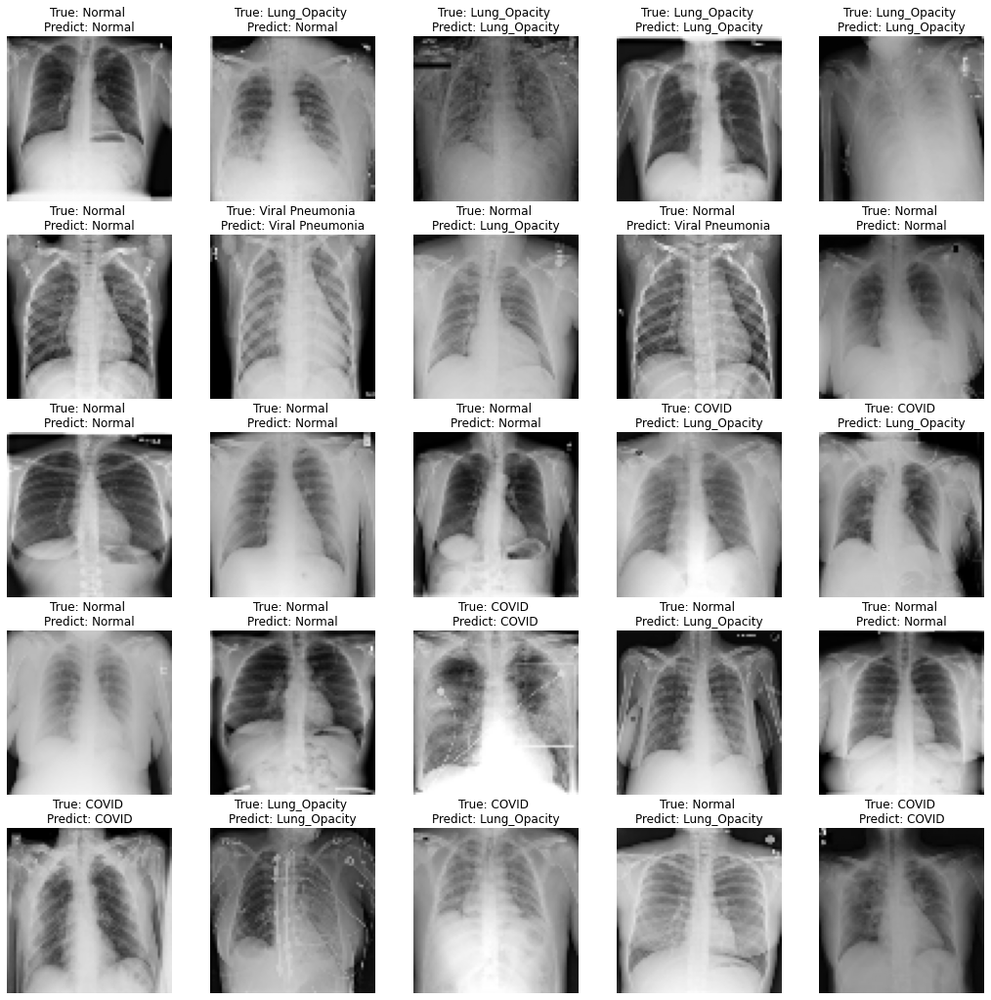

In [ ]:
# Implementing Logistic Regression
model = LogisticRegression(max_iter=5000)
print("Using \"Logistic Regression\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/LogisticRegression.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: Decision Tree***

Using "Decision Tree" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.6891 ~ 68.91%

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.57      0.58       727
           1       0.63      0.64      0.63      1191
           2       0.77      0.76      0.76      2058
           3       0.63      0.69      0.66       257

    accuracy                           0.69      4233
   macro avg       0.65      0.67      0.66      4233
weighted avg       0.69      0.69      0.69      4233


Confusion Matrix:


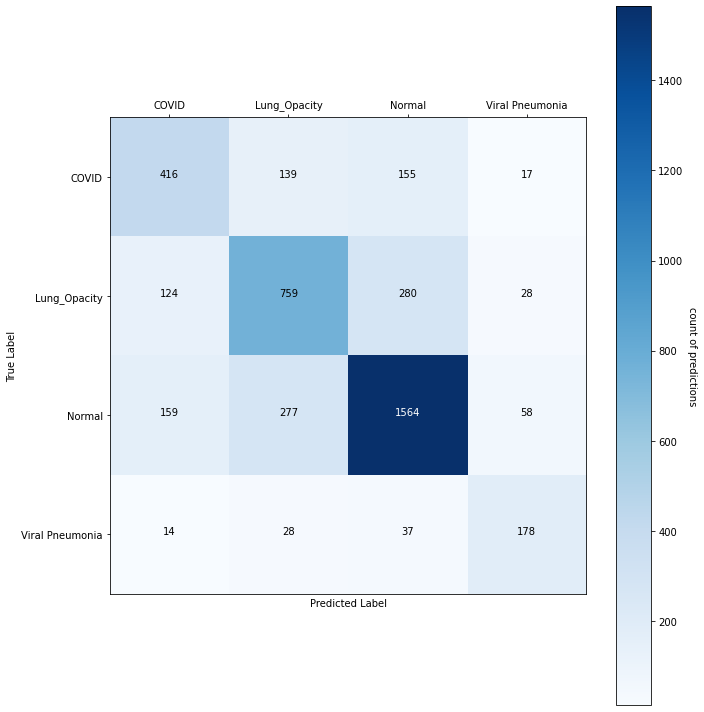



Model Predicted labels vs Original Labels: 


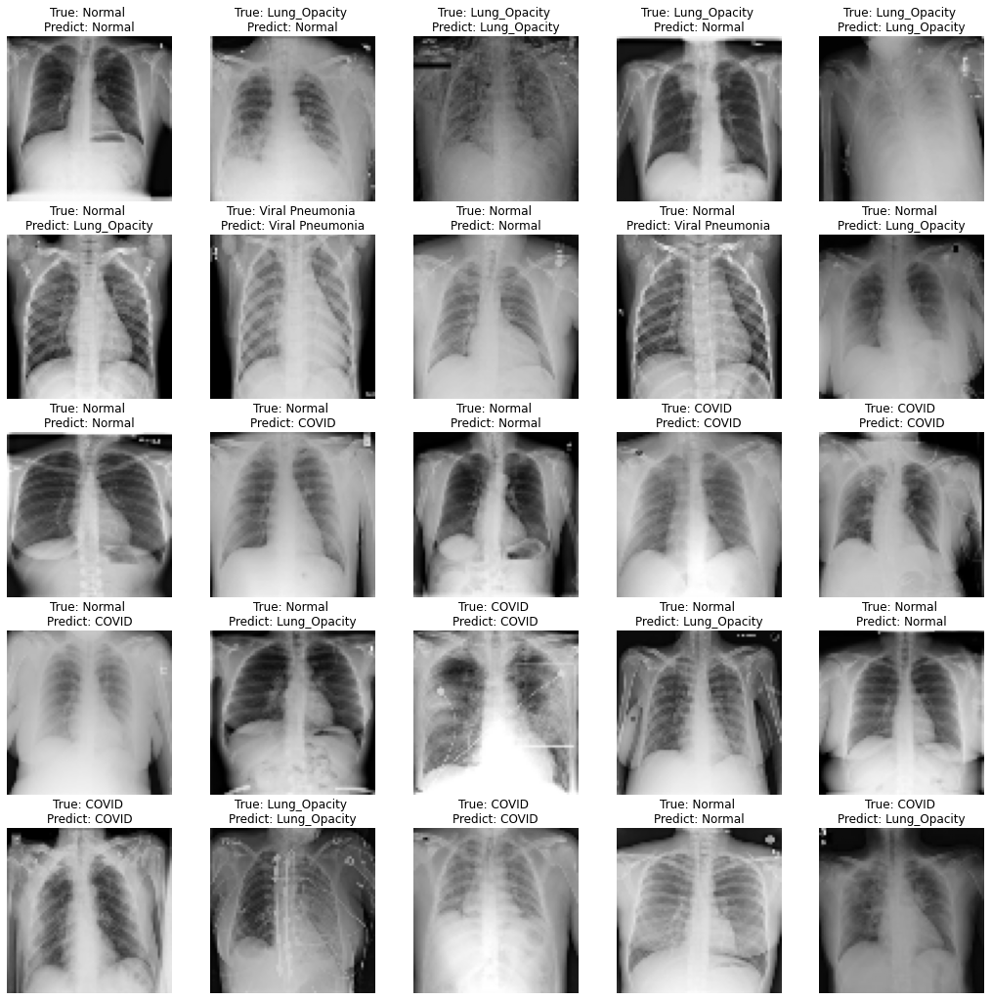

In [ ]:
# Implementing Decision Tree
model = DecisionTreeClassifier(max_depth=25)
print("Using \"Decision Tree\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/DecisionTree.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: Random Forest***

Using "Random Forest" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.8349 ~ 83.49%

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.71      0.79       727
           1       0.78      0.78      0.78      1191
           2       0.84      0.92      0.88      2058
           3       0.91      0.79      0.84       257

    accuracy                           0.83      4233
   macro avg       0.86      0.80      0.82      4233
weighted avg       0.84      0.83      0.83      4233


Confusion Matrix:


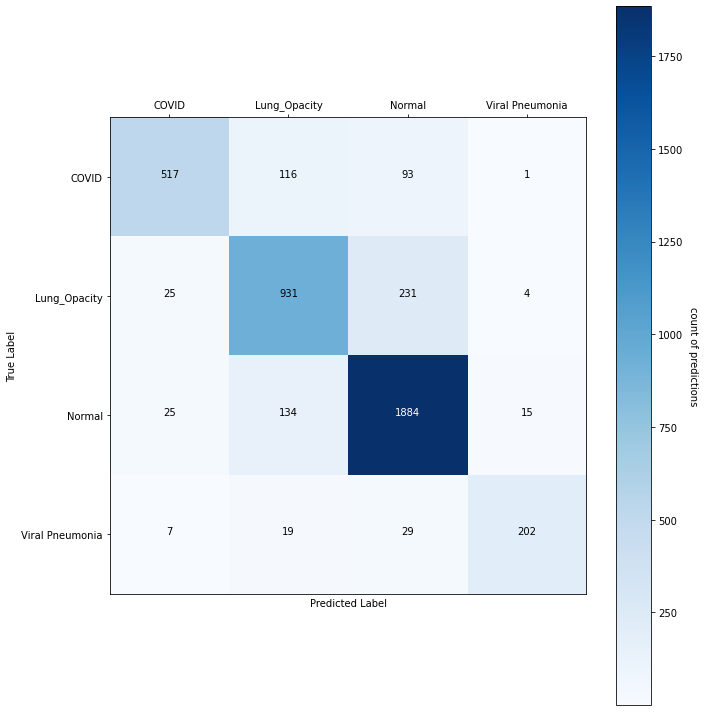



Model Predicted labels vs Original Labels: 


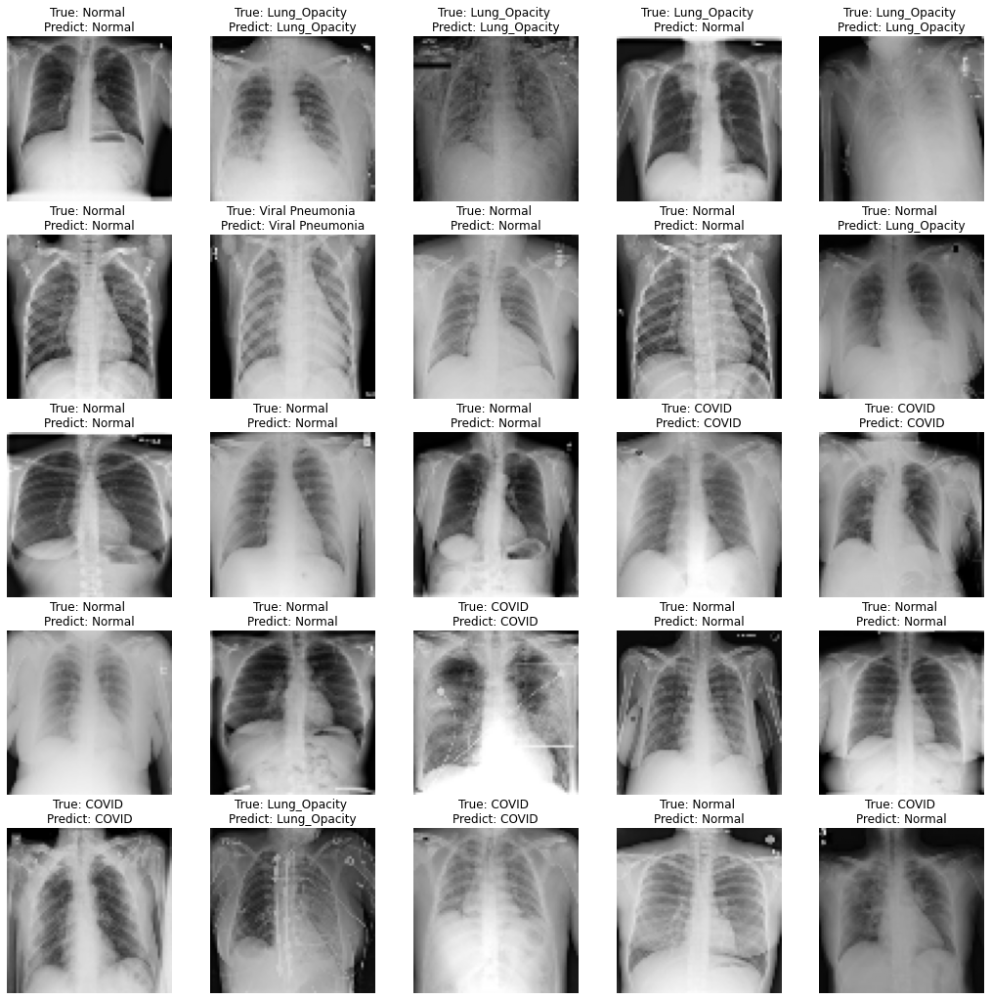

In [ ]:
# Implementing Random Forest
model=RandomForestClassifier(n_estimators=300)
print("Using \"Random Forest\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/RandomForest.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: K-Neighbors***

Using "K-Neighbors" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.7888 ~ 78.88%

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.61      0.65       701
           1       0.73      0.74      0.74      1205
           2       0.84      0.86      0.85      2074
           3       0.89      0.92      0.90       253

    accuracy                           0.79      4233
   macro avg       0.79      0.78      0.79      4233
weighted avg       0.79      0.79      0.79      4233


Confusion Matrix:


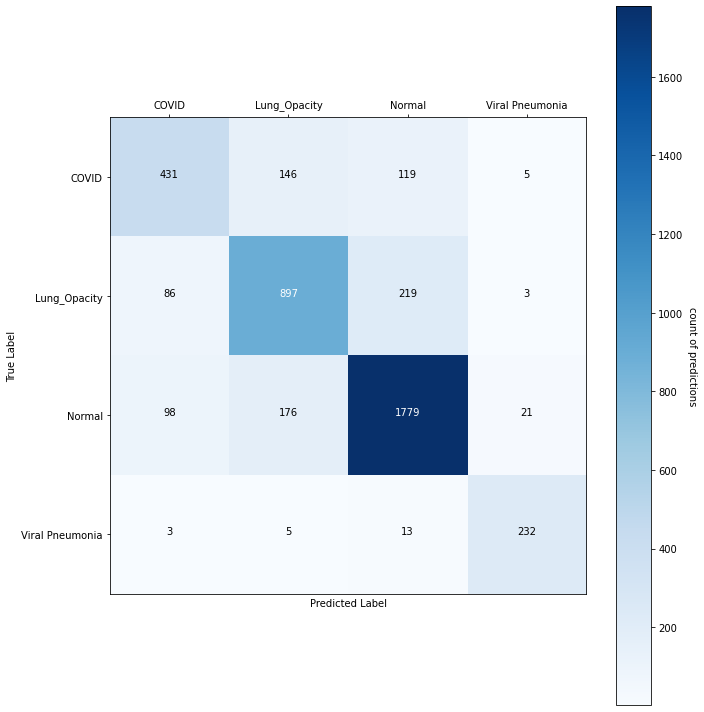



Model Predicted labels vs Original Labels: 


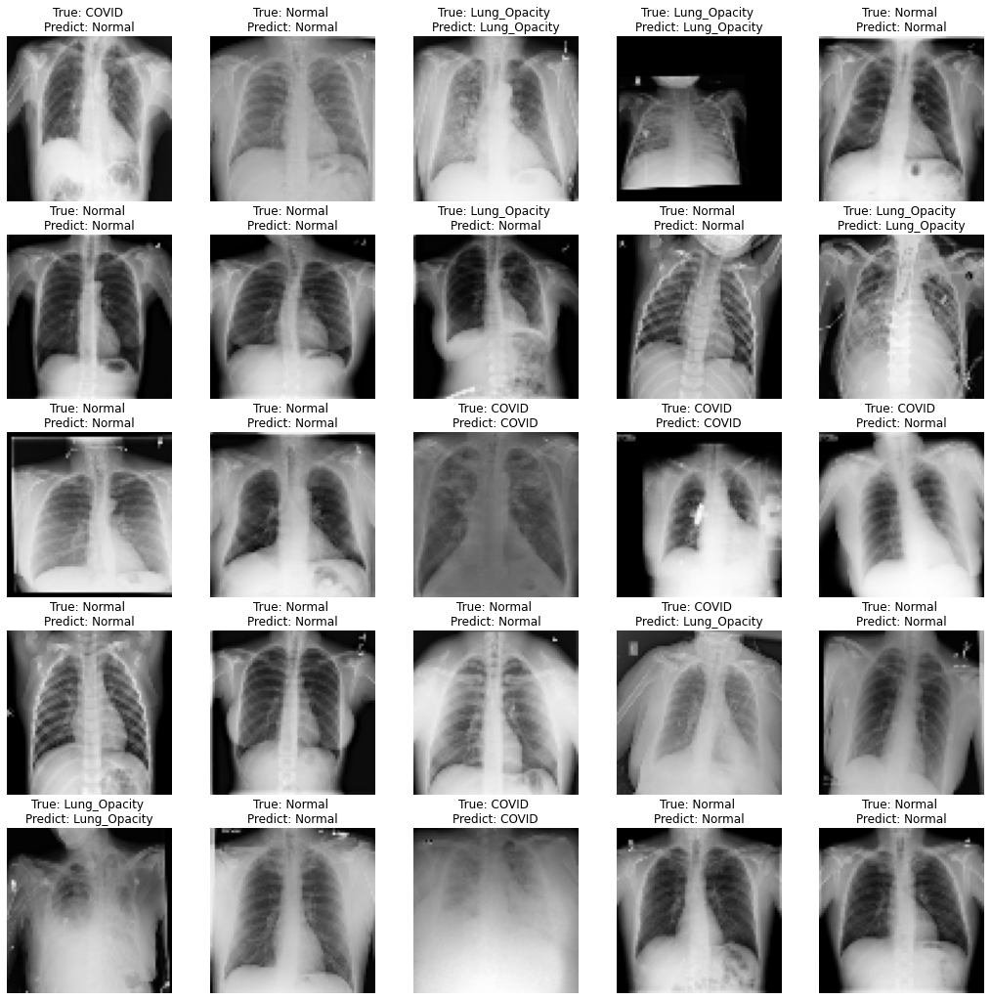

In [ ]:
# Implementing K-Neighbors
model = KNeighborsClassifier(n_neighbors=7)
print("Using \"K-Neighbors\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/KNeighbors.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: SVM***


Accuracy Score: 0.6853 ~ 68.53%

Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.62      0.55       732
           1       0.64      0.58      0.61      1215
           2       0.78      0.75      0.77      2055
           3       0.84      0.87      0.86       231

    accuracy                           0.69      4233
   macro avg       0.69      0.71      0.70      4233
weighted avg       0.69      0.69      0.69      4233


Confusion Matrix:


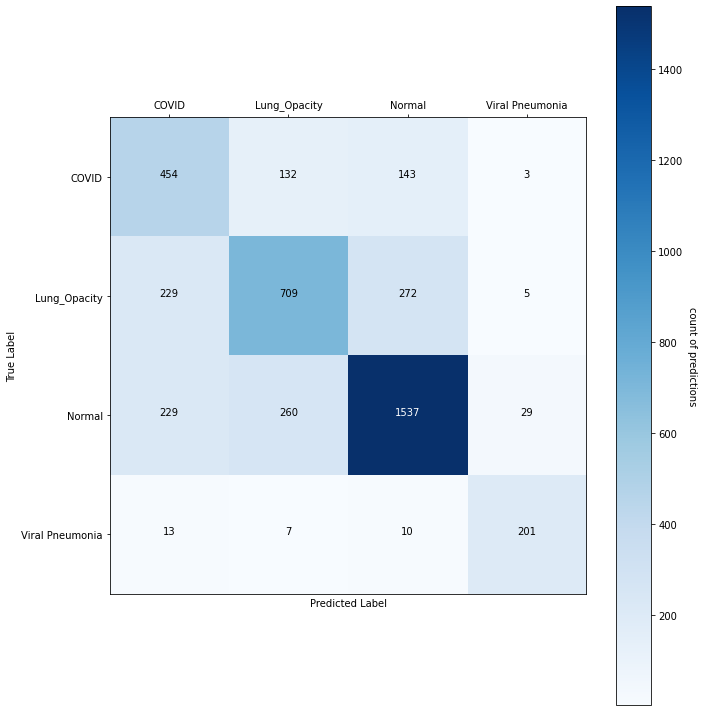



Model Predicted labels vs Original Labels: 


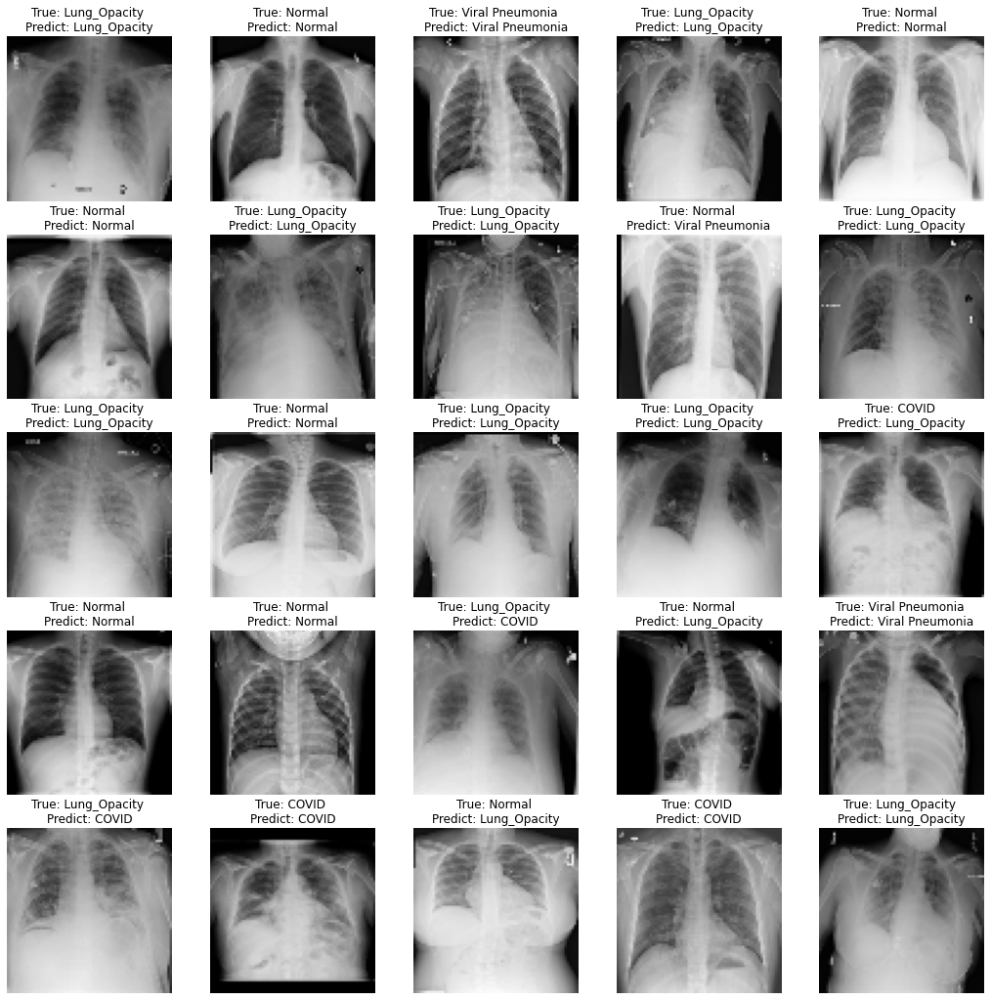

In [ ]:
# Implementing SVM (Linear)
model = SVC(kernel='linear')
print("Using \"SVM (Linear)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/SVMLinear.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

Using "SVM (RBF)" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.8259 ~ 82.59%

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.68      0.73       732
           1       0.82      0.74      0.78      1215
           2       0.83      0.92      0.87      2055
           3       0.90      0.91      0.91       231

    accuracy                           0.83      4233
   macro avg       0.84      0.81      0.82      4233
weighted avg       0.83      0.83      0.82      4233


Confusion Matrix:


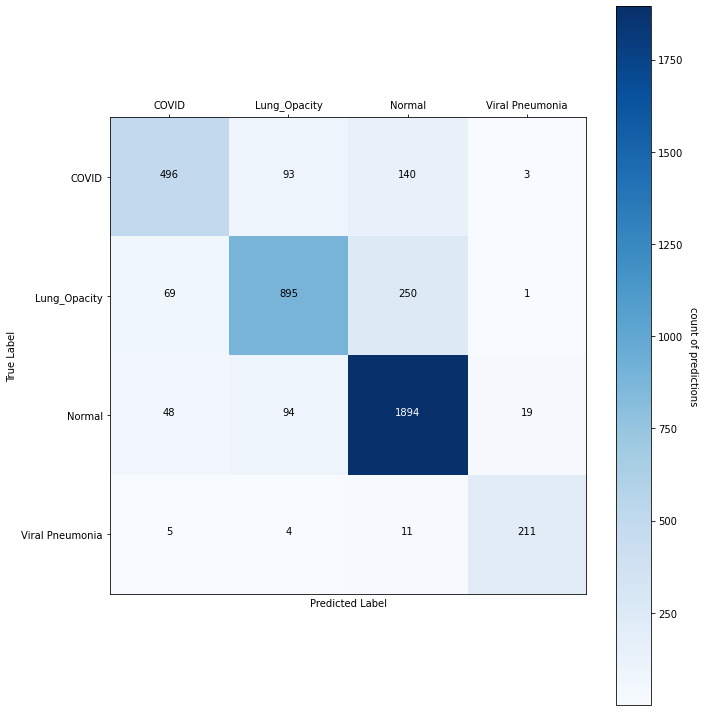



Model Predicted labels vs Original Labels: 


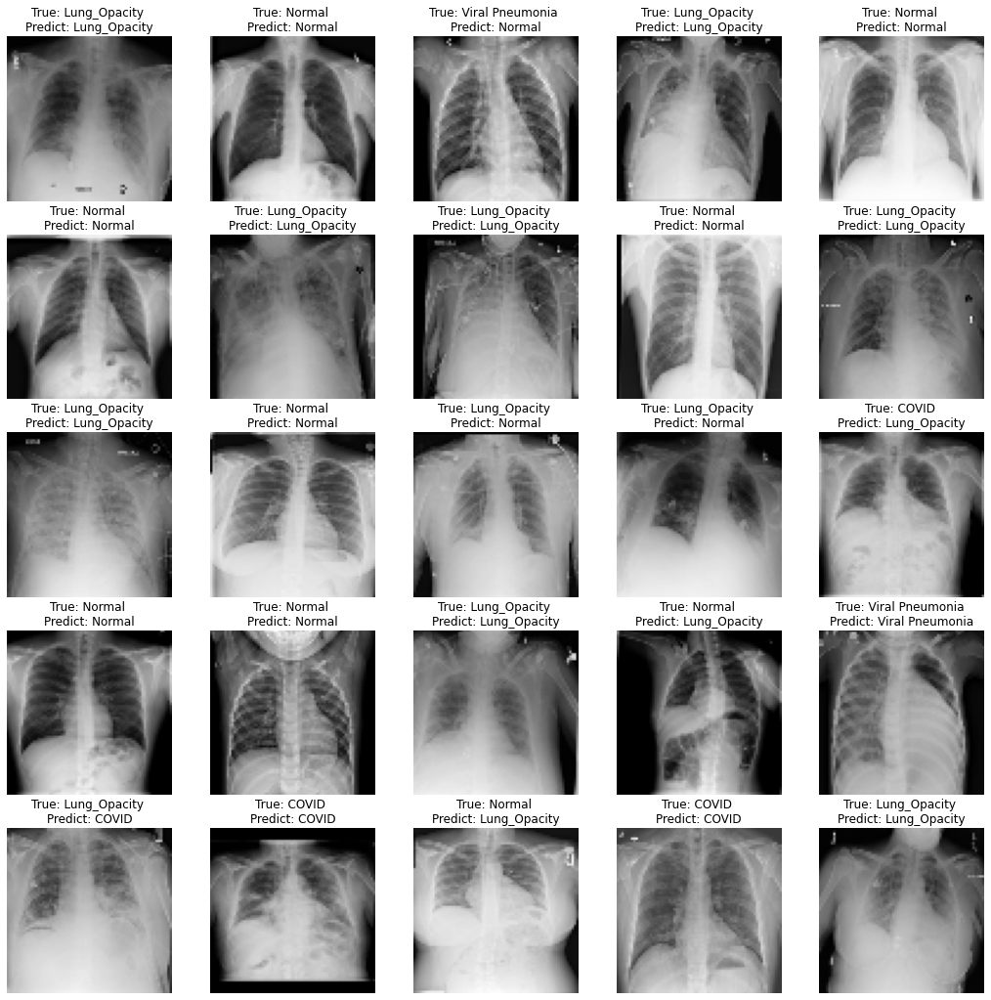

In [ ]:
# Implementing SVM (RBF)
model = SVC(kernel='rbf')
print("Using \"SVM (RBF)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/SVMRbf.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: Naive Bayes***

Using "Naive Bayes (Gaussian)" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.5743 ~ 57.43%

Classification Report:
              precision    recall  f1-score   support

           0       0.36      0.59      0.45       727
           1       0.59      0.61      0.60      1191
           2       0.81      0.51      0.63      2058
           3       0.45      0.86      0.59       257

    accuracy                           0.57      4233
   macro avg       0.55      0.64      0.56      4233
weighted avg       0.65      0.57      0.59      4233


Confusion Matrix:


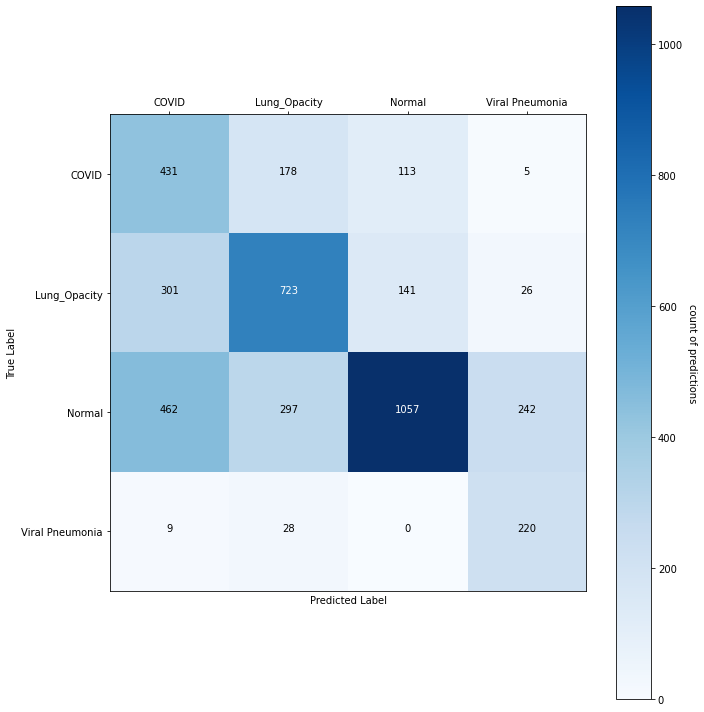



Model Predicted labels vs Original Labels: 


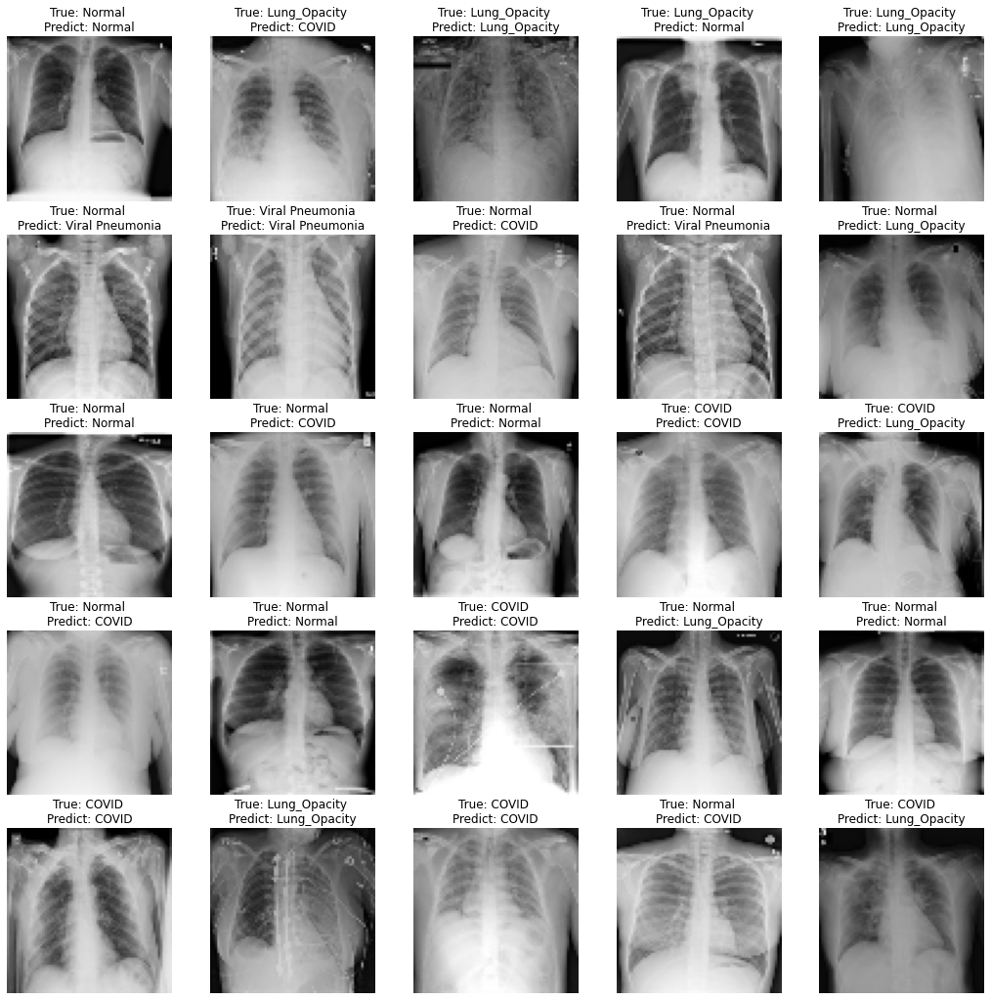

In [ ]:
# Implementing Naive Bayes (Gaussian)
model = GaussianNB()
print("Using \"Naive Bayes (Gaussian)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/NaiveBayesGaussian.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

Using "Naive Bayes (Multinomial)" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.5549 ~ 55.49%

Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.55      0.42       727
           1       0.61      0.56      0.58      1191
           2       0.79      0.51      0.62      2058
           3       0.37      0.88      0.52       257

    accuracy                           0.55      4233
   macro avg       0.53      0.63      0.54      4233
weighted avg       0.64      0.55      0.57      4233


Confusion Matrix:


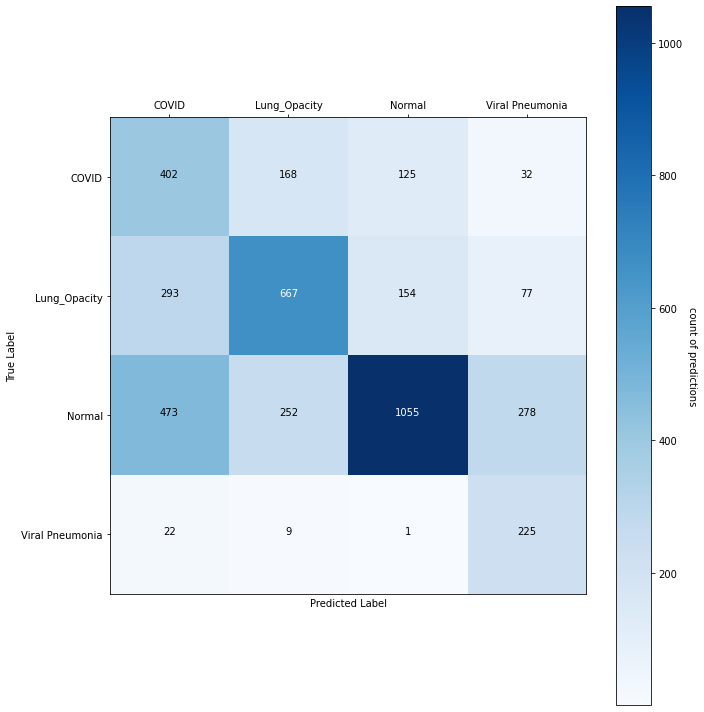



Model Predicted labels vs Original Labels: 


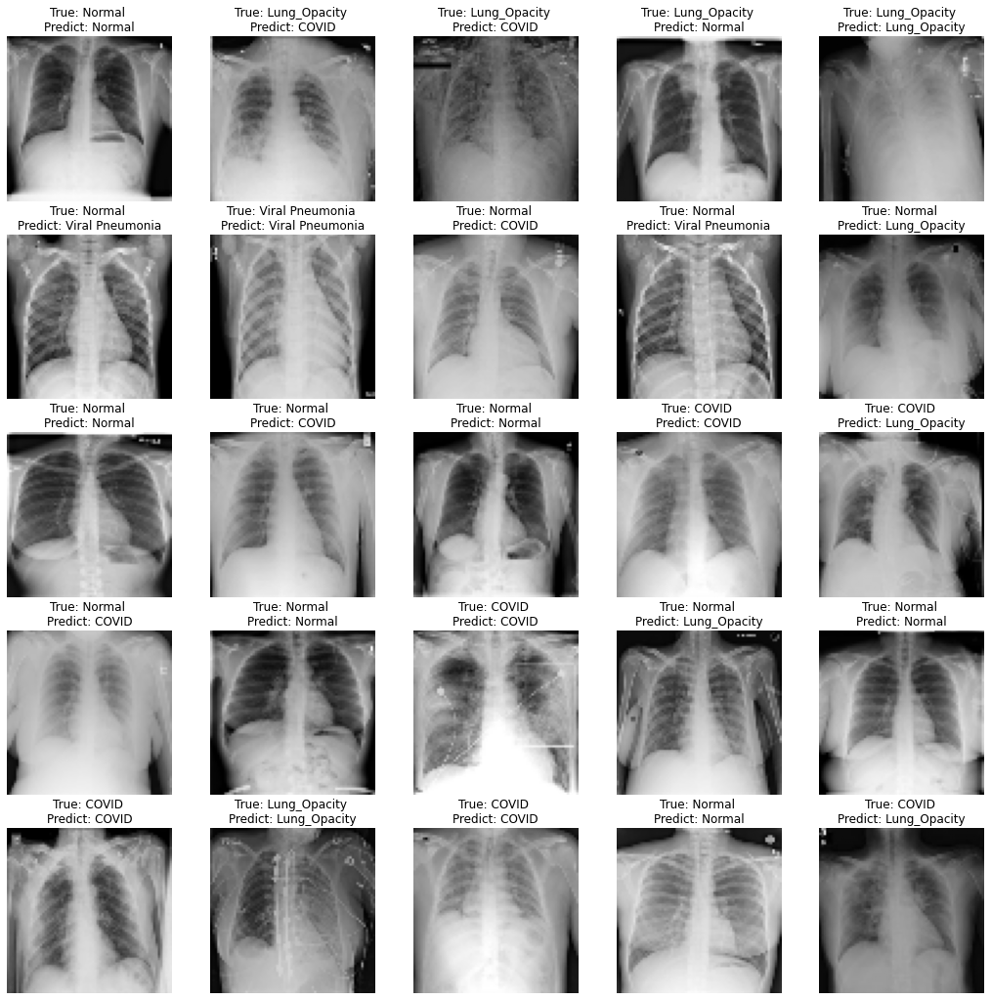

In [ ]:
# Implementing Naive Bayes (Multinomial)
model = MultinomialNB()
print("Using \"Naive Bayes (Multinomial)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/NaiveBayesMultinomial.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

Using "Naive Bayes (Complement)" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.6060 ~ 60.60%

Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.34      0.39       727
           1       0.64      0.58      0.61      1191
           2       0.77      0.67      0.71      2058
           3       0.30      0.94      0.46       257

    accuracy                           0.61      4233
   macro avg       0.54      0.63      0.54      4233
weighted avg       0.65      0.61      0.61      4233


Confusion Matrix:


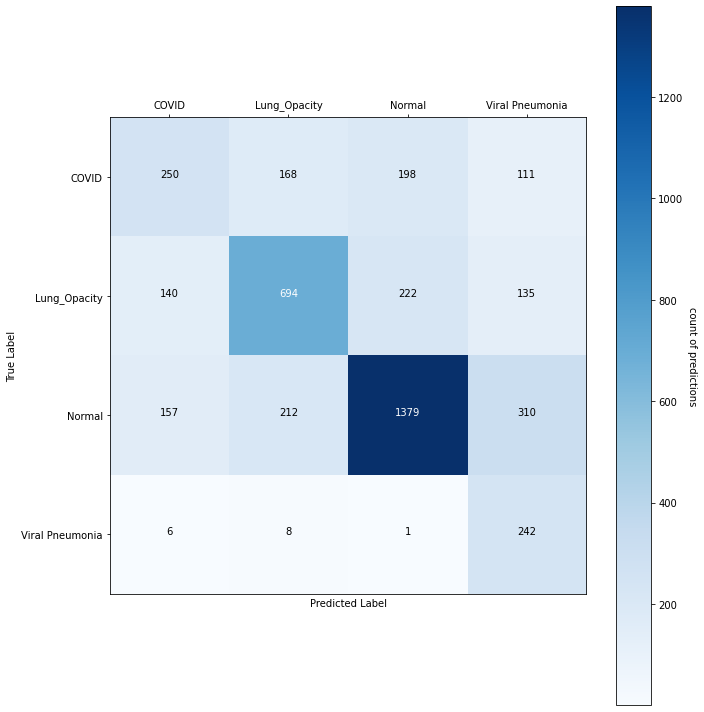



Model Predicted labels vs Original Labels: 


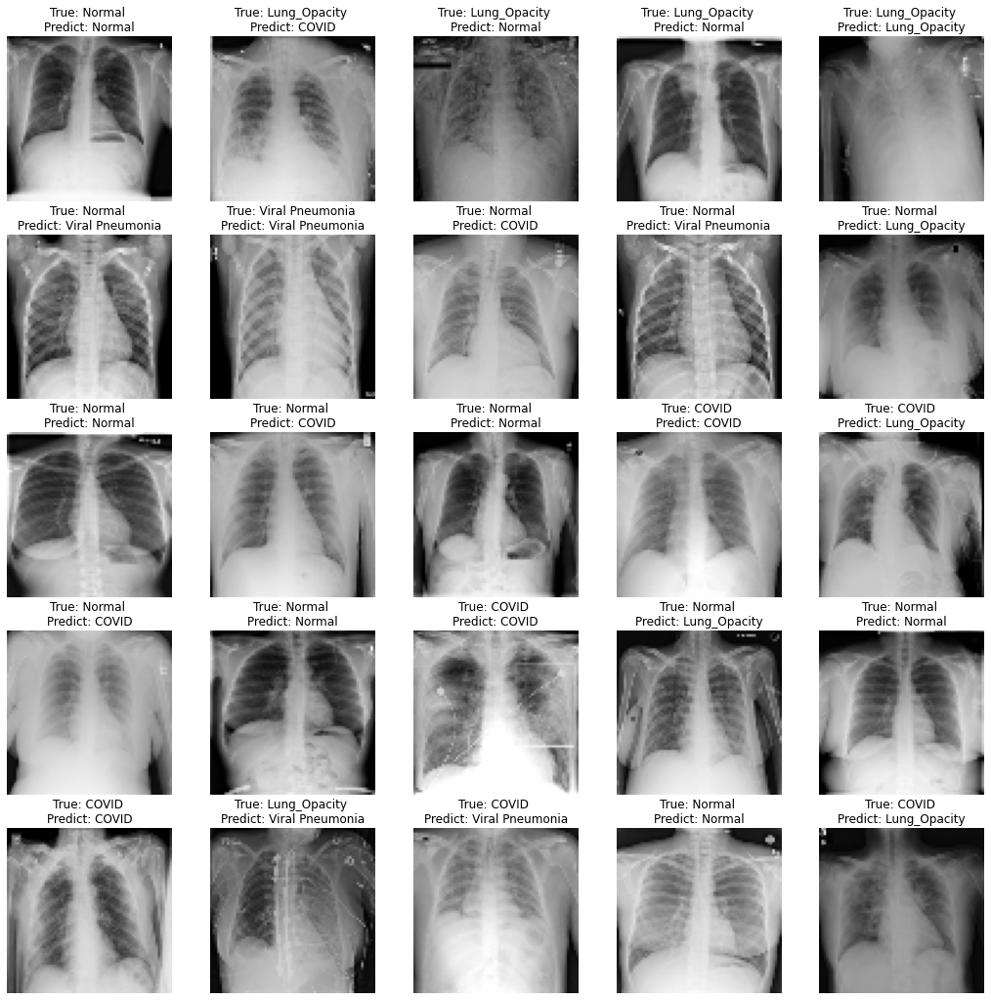

In [ ]:
# Implementing Naive Bayes (Complement)
model = ComplementNB()
print("Using \"Naive Bayes (Complement)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/NaiveBayesComplement.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

Using "Naive Bayes (Bernoulli)" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.4255 ~ 42.55%

Classification Report:
              precision    recall  f1-score   support

           0       0.29      0.17      0.21       727
           1       0.37      0.79      0.50      1191
           2       0.74      0.29      0.41      2058
           3       0.31      0.58      0.40       257

    accuracy                           0.43      4233
   macro avg       0.43      0.46      0.38      4233
weighted avg       0.53      0.43      0.40      4233


Confusion Matrix:


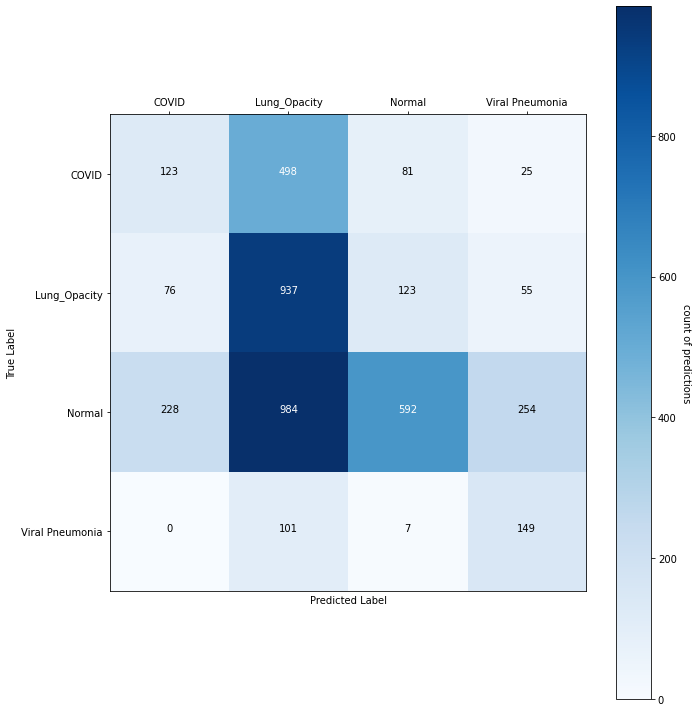



Model Predicted labels vs Original Labels: 


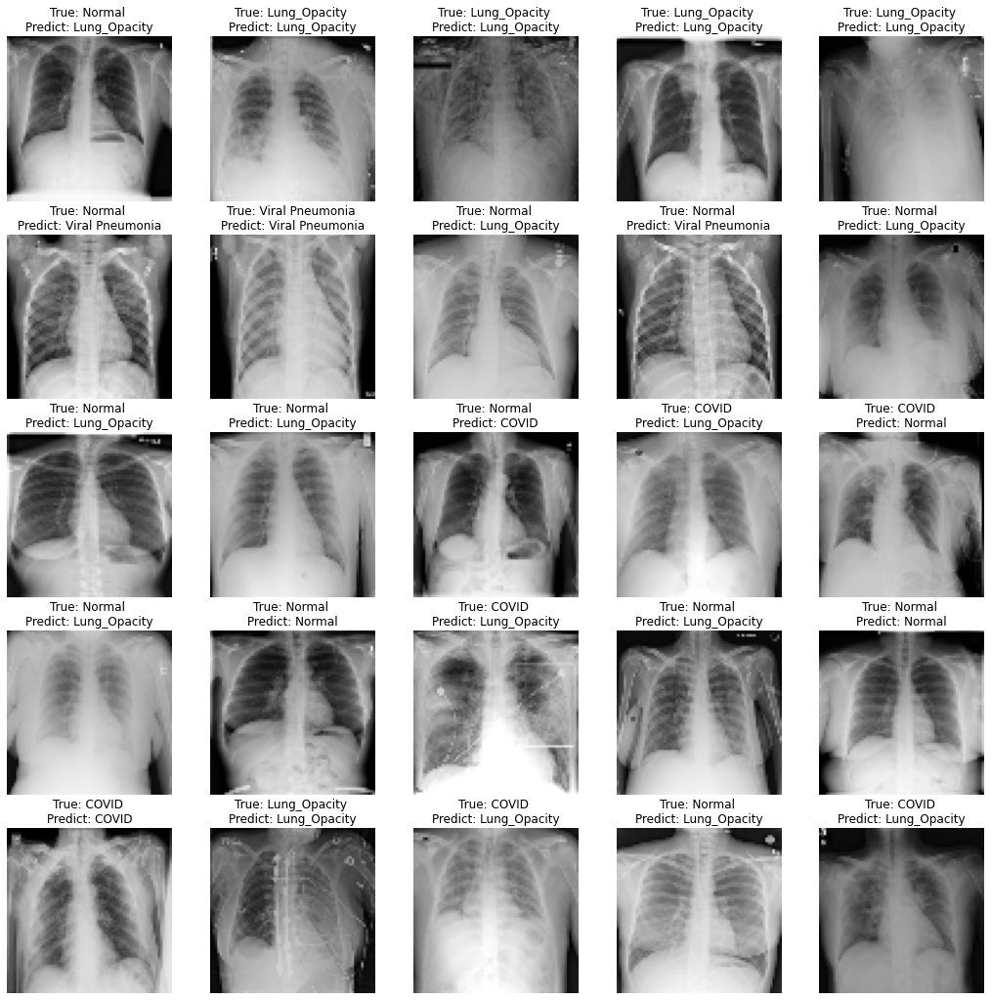

In [ ]:
# Implementing Naive Bayes (Bernoulli)
model = BernoulliNB()
print("Using \"Naive Bayes (Bernoulli)\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/NaiveBayesBernoulli.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# ***ML Model: Ada Boost***

Using "Ada Boost" as Machine Learning Classification Algorithm:- 

Accuracy Score: 0.5615 ~ 56.15%

Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.01      0.02       732
           1       0.74      0.25      0.37      1215
           2       0.54      0.96      0.69      2055
           3       0.73      0.40      0.52       231

    accuracy                           0.56      4233
   macro avg       0.69      0.41      0.40      4233
weighted avg       0.64      0.56      0.47      4233


Confusion Matrix:


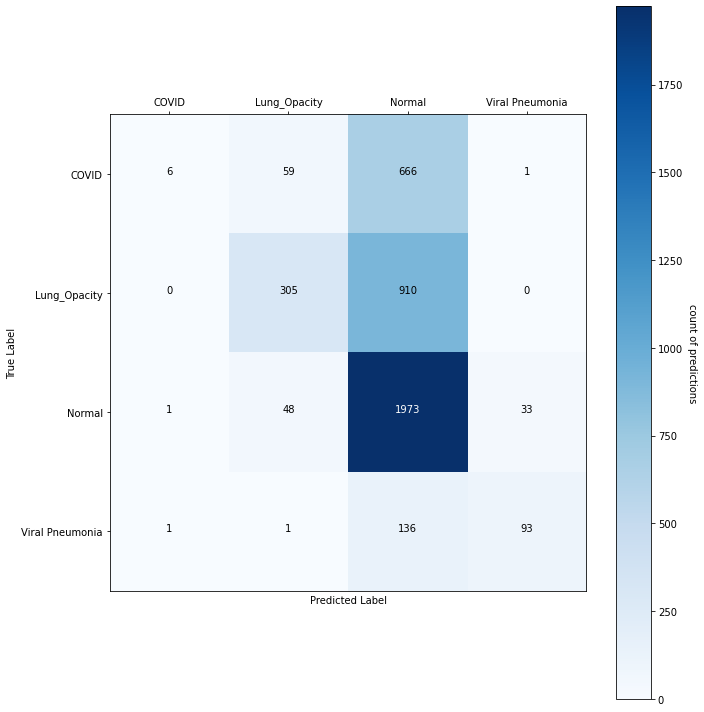



Model Predicted labels vs Original Labels: 


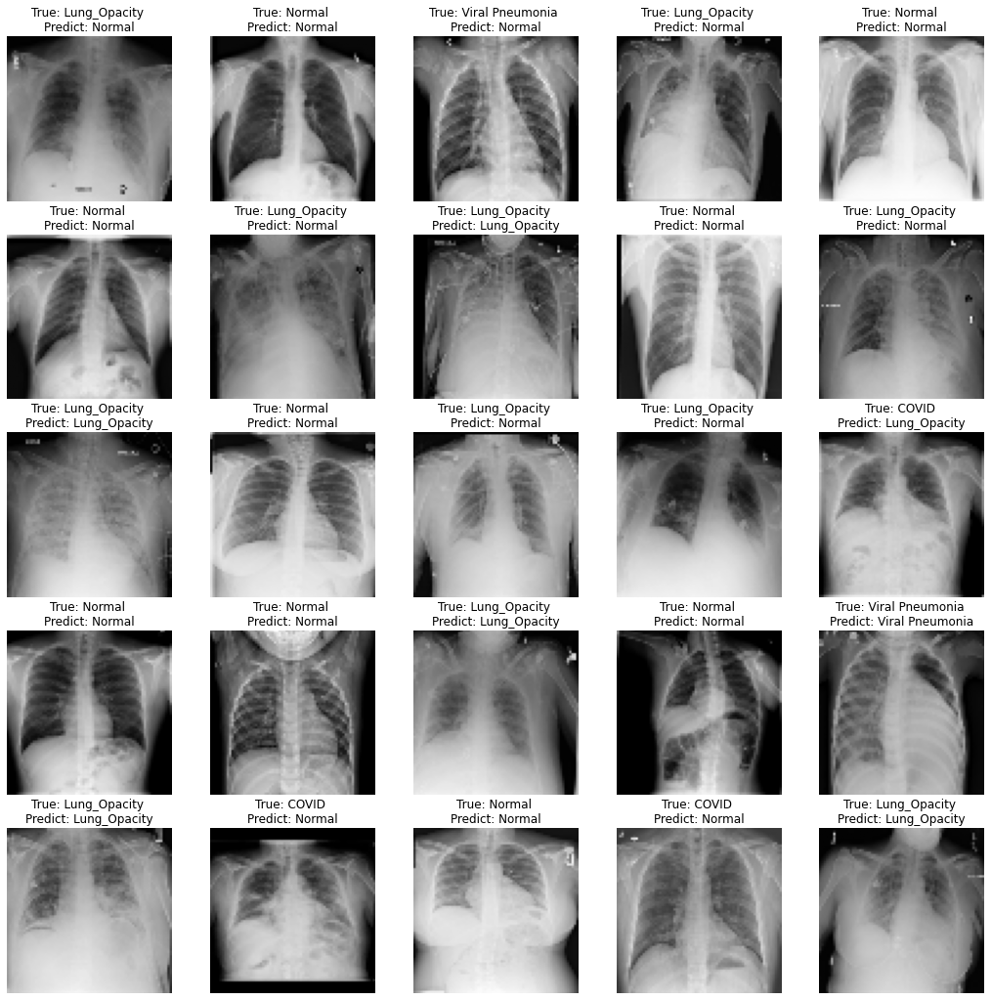

In [ ]:
# Implementing Ada Boost
model = AdaBoostClassifier(n_estimators=50, learning_rate=0.1)
print("Using \"Ada Boost\" as Machine Learning Classification Algorithm:- ")
model.fit(X_train_ML,y_train)
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/AdaBoost.h5'
pick_insert = open(filename,'wb')
pickle.dump(model, pick_insert)
pick_insert.close()
model_eval_ML(model, X_test_ML, y_test, X_test)

# **Loading An ML Model**

In [ ]:
# Loading An ML Model
filename = '/content/drive/MyDrive/COVID-19_Radiography_Dataset/BestModel/Model.h5'
pick_read = open(filename,'rb')
model = pickle.load(pick_read)
pick_read.close()

# **Plotting Accuracy of All ML Models**

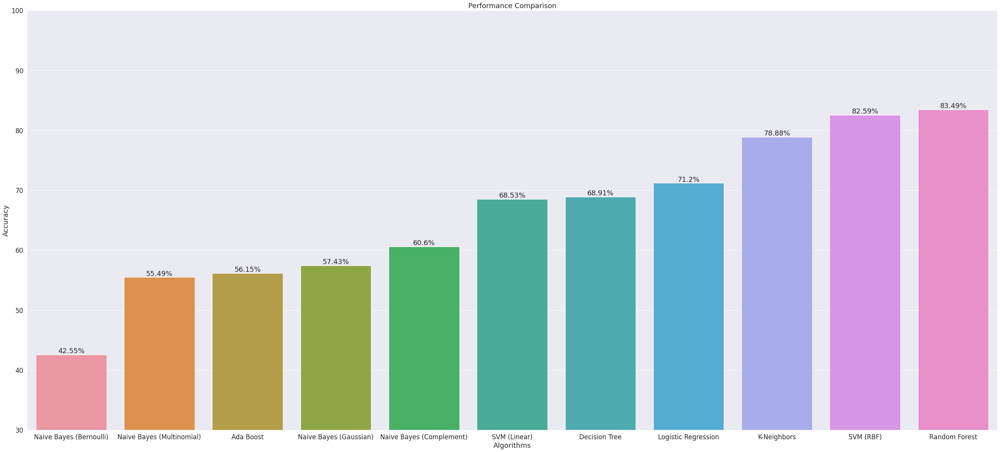

In [ ]:
# Plotting Accuracy of All ML Models
ML_models = ['Naive Bayes (Bernoulli)', 'Naive Bayes (Multinomial)', 'Ada Boost', 'Naive Bayes (Gaussian)', 'Naive Bayes (Complement)', 'SVM (Linear)', 'Decision Tree', 'Logistic Regression', 'K-Neighbors', 'SVM (RBF)', 'Random Forest']
accuracy = [42.55, 55.49, 56.15, 57.43, 60.60, 68.53, 68.91, 71.20, 78.88, 82.59, 83.49]

sns.set(font_scale = 1.5, palette="husl")
plt.figure(figsize=(45,20))
sns.barplot(x=ML_models, y=accuracy)
for i in range(len(ML_models)):
    value = str(accuracy[i]) + "%"
    plt.text(i, accuracy[i], value, ha="center", va="bottom")
plt.title('Performance Comparison')
plt.ylabel('Accuracy') 
plt.xlabel('Algorithms')
plt.ylim([30,100])
# plt.yticks(np.arange(30, 101, 5))

plt.show()